# Dynamic Time Series Analysis

In this notebook a dynamic time series analysis of meteorological and hydrological data will be performed

In [51]:
#import general packages
import numpy as np
import importlib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb



#import analysis packages
import ipympl
from scipy.signal import periodogram 

# import state space models package
import statsmodels.api as sm

#import custom functions
from custom_functions import data_split, UCM 
importlib.reload(UCM)
importlib.reload(data_split)

# set plotting to unique style
sb.set_theme(style="ticks")
sb.set_context("paper")
%matplotlib widget

## create a dictionary to store all the data in

In [52]:
# Template for each site
site_template = {
    "raw": None,
    "train_period":[],
    "test_period":[],
    "train": None,
    "test": None,
    "model_settings":{},
    "model_performance":{},
    "results": {},
    "forecasts": {},
    "train_residuals":{},
    "test_residuals":{}
}

# List of sites
sites = ["Toreadora", "Virgen", "Chirimachay", "OPNC", "Balzay", "Zhurucay"]

# List of variables
variables = ["Temperature", "Precipitation", "Relative_Humidity", ""]

# Create the main dictionary
analysis_overview= {var: {site: site_template.copy() for site in sites} for var in variables}


# Custom functions


In [53]:
def Inspect_freq(data, station):    
    # if Series, just use values directly
    if isinstance(data, pd.Series):
        y = data.astype(float).values
    else:
        y = data.iloc[:, 0].astype(float).values

    y = y[~np.isnan(y)]  # remove NaNs
    fs = 1  # 1/day sampling

    f, Pxx_den = periodogram(y, fs)

    # Exclude the zero frequency
    mask = f > 0
    f = f[mask]
    Pxx_den = Pxx_den[mask]

    # Convert to period in days
    period_days = 1 / f

    plt.figure(figsize=(8,5))
    plt.semilogy(period_days, Pxx_den)
    plt.xscale('log')
    plt.xlabel('Period [days]')
    plt.ylabel('PSD [°C²/Hz]')
    plt.title(f'Periodogram of Air Temperature ({station})')
    plt.grid(True, which='both', linestyle='--', alpha=0.5)

    # Add reference lines
    for d, label in [(7, '1 week'), (30, '1 month'), (182.5, '6 months'), (365, '1 year')]:
        plt.axvline(d, color='r', linestyle=':', alpha=0.7)
        plt.text(d, max(Pxx_den)*0.8, label, rotation=90, color='r', va='top', ha='center')

    plt.tight_layout()
    plt.show()

    return f, Pxx_den

In [54]:
def fit_forecast_model(Variable, station, model, analysis_overview, exog_vars_future=None, n_bins=None):

    # Fit the model
    _, test_stat = model.fit()
    
    #plot diagnostics
    model.diagnostics()
    
    #Forcast the model
    if n_bins is not None:
        n_bins = 6
    fitted, forecast, residuals = model.forecast(bins=n_bins, exog_future=exog_vars_future)

    # Plot results
    model.plot_results(plot_trend=False)
    
    # Report scores
    model_scores = model.report_scores()

    # Append to dict
    analysis_overview[Variable][station].update({ 'results':fitted,
                                        'model_settings':model.model_settings,
                                        'model_performance': test_stat,
                                        'forecast':forecast,
                                        'train_residuals':residuals['train_residuals'],
                                        'test_residuals':residuals['test_residuals']})

# Temperature Data

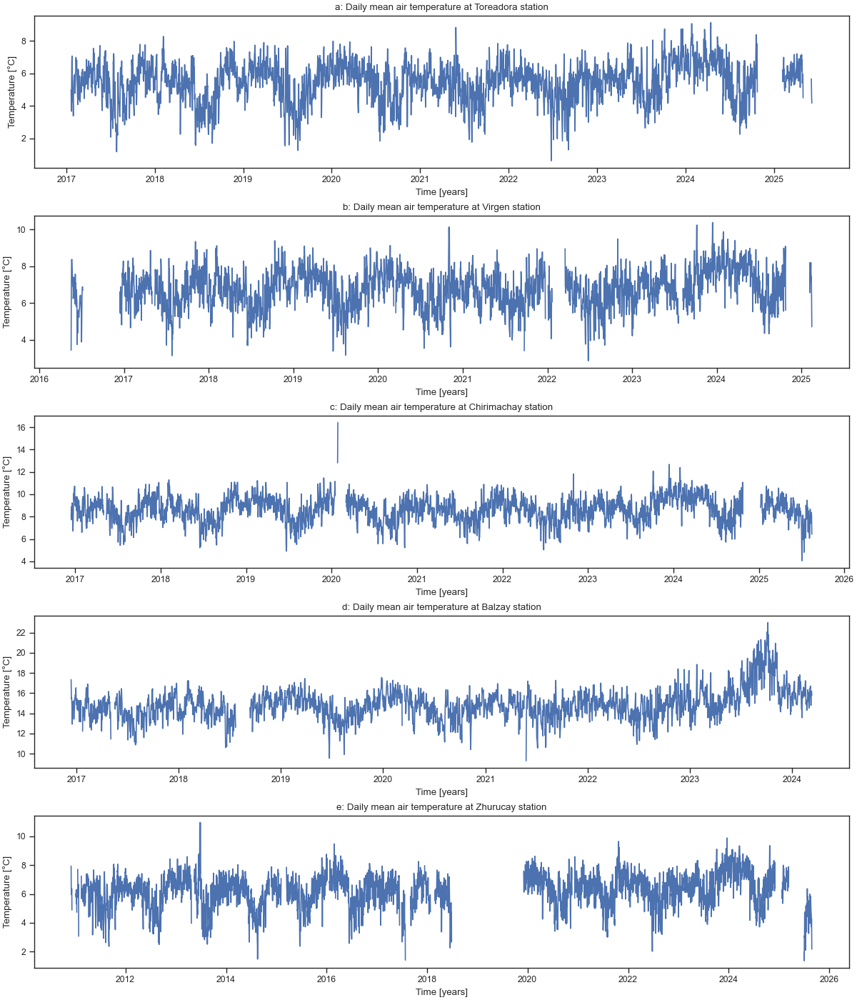

In [55]:
# Load data, extract relevant col, convert index to datetime, append to dict
Zhur_T_day = pd.read_csv(f"../../data/Zhurucay/Metereological/Zhurucay_daily_mean_AirTC_Avg.csv")
Zhur_T_day['TIMESTAMP'] = pd.to_datetime(Zhur_T_day['TIMESTAMP'])
Zhur_T_day.set_index('TIMESTAMP', inplace=True)
analysis_overview['Temperature']['Zhurucay']['raw'] = Zhur_T_day

Balzay_T_data = pd.read_csv("../../data/Quinuas/Metereological/Balzay_daily_mean_AirTC_Avg.csv", sep=",", engine="python", on_bad_lines="skip")
Balzay_T_data['TIMESTAMP'] = pd.to_datetime(Balzay_T_data['TIMESTAMP'], errors='coerce')
Balzay_T_data.set_index('TIMESTAMP', inplace=True)
analysis_overview['Temperature']['Balzay']['raw'] = Balzay_T_data

Chirimachay_T_data = pd.read_csv("../../data/Quinuas/Metereological/Chirimachay_daily_mean_AirTC_Avg.csv")
Chirimachay_T_data['TIMESTAMP'] = pd.to_datetime(Chirimachay_T_data['TIMESTAMP'], errors='coerce')
Chirimachay_T_data.set_index('TIMESTAMP', inplace=True)
analysis_overview['Temperature']['Chirimachay']['raw'] = Chirimachay_T_data

Toreadora_T_data = pd.read_csv("../../data/Quinuas/Metereological/Toreadora_daily_mean_AirTC_Avg.csv")
Toreadora_T_data['TIMESTAMP'] = pd.to_datetime(Toreadora_T_data['TIMESTAMP'], errors='coerce')
Toreadora_T_data.set_index('TIMESTAMP', inplace=True)
analysis_overview['Temperature']['Toreadora']['raw'] = Toreadora_T_data
                         
Virgen_T_data = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_mean_AirTC_Avg.csv")
Virgen_T_data['TIMESTAMP'] = pd.to_datetime(Virgen_T_data['TIMESTAMP'], errors='coerce')
Virgen_T_data.set_index('TIMESTAMP', inplace=True)
analysis_overview['Temperature']['Virgen']['raw'] = Virgen_T_data


# PLot temperature data
fig,ax = plt.subplots(nrows=5,figsize=(12,14),layout="constrained")
#fig.suptitle('Daily mean air temperature at Quinuas stations', fontsize=16)

ax[0].plot(Toreadora_T_data['AirTC_Avg'], label='Toreadora')
ax[0].title.set_text('a: Daily mean air temperature at Toreadora station')
ax[0].set_ylabel('Temperature [°C]')
ax[0].set_xlabel('Time [years]')

ax[1].plot(Virgen_T_data['AirTC_Avg'], label='Virgen')
ax[1].title.set_text('b: Daily mean air temperature at Virgen station')
ax[1].set_ylabel('Temperature [°C]')
ax[1].set_xlabel('Time [years]')

ax[2].plot(Chirimachay_T_data['AirTC_Avg'], label='Virgen')
ax[2].title.set_text('c: Daily mean air temperature at Chirimachay station')
ax[2].set_ylabel('Temperature [°C]')   
ax[2].set_xlabel('Time [years]')

ax[3].plot(Balzay_T_data['AirTC_Avg'], label='Balzay')
ax[3].title.set_text('d: Daily mean air temperature at Balzay station')
ax[3].set_ylabel('Temperature [°C]')
ax[3].set_xlabel('Time [years]')

ax[4].plot(Zhur_T_day['AirTC_Avg'], label='Zhurucay')
ax[4].title.set_text('e: Daily mean air temperature at Zhurucay station')
ax[4].set_ylabel('Temperature [°C]')
ax[4].set_xlabel('Time [years]')

fig.tight_layout
plt.show()

## Clean & divide dataset

- select training and test data.

Some comments:
- Start Virgen station should be at 2017-01-01, else data will diffuse & End dat should approx month 10 of 2024
- Start Zhurucay should be approx 4 months later, else diffusion will occur
- There seems to be an outlier in the Chirimachay data, make sure it is not included

c:\Users\mathi\Desktop\TU Delft\MPD 2025\Python\code\Github\custom_functions\data_split.py:133: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


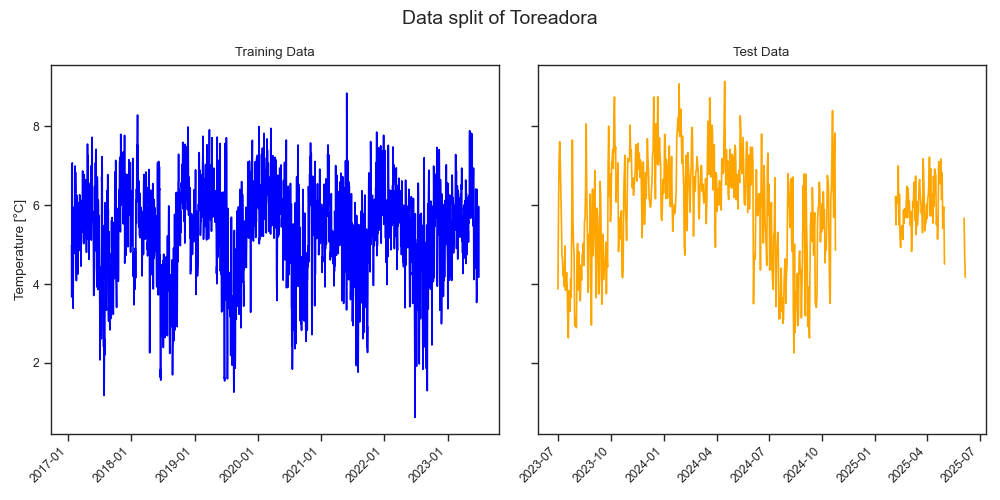

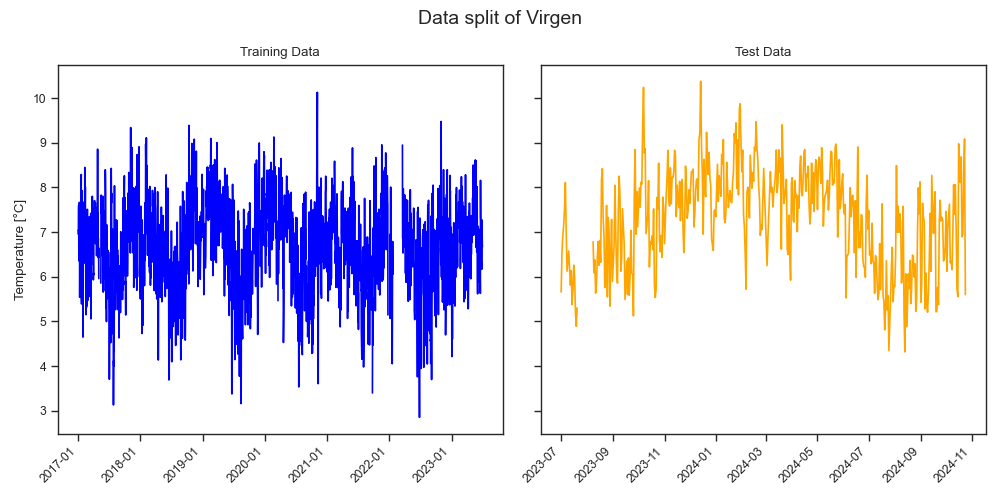

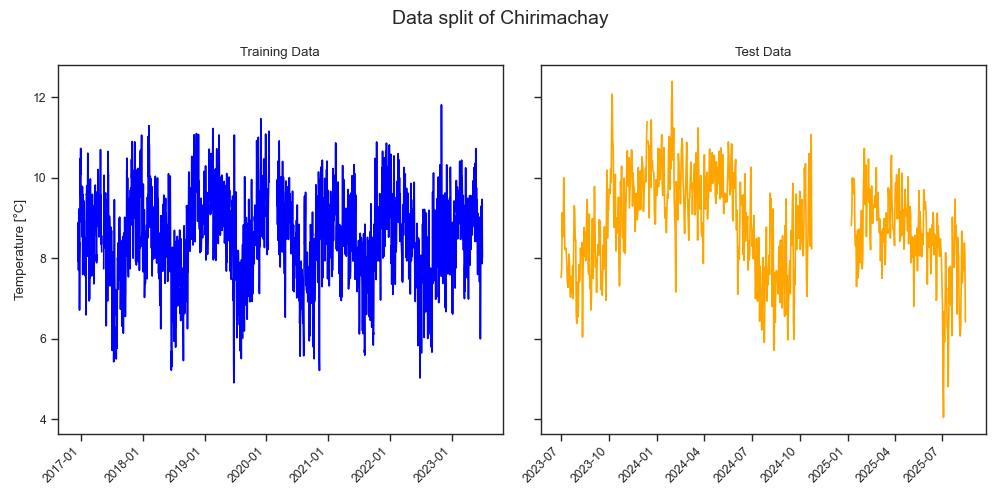

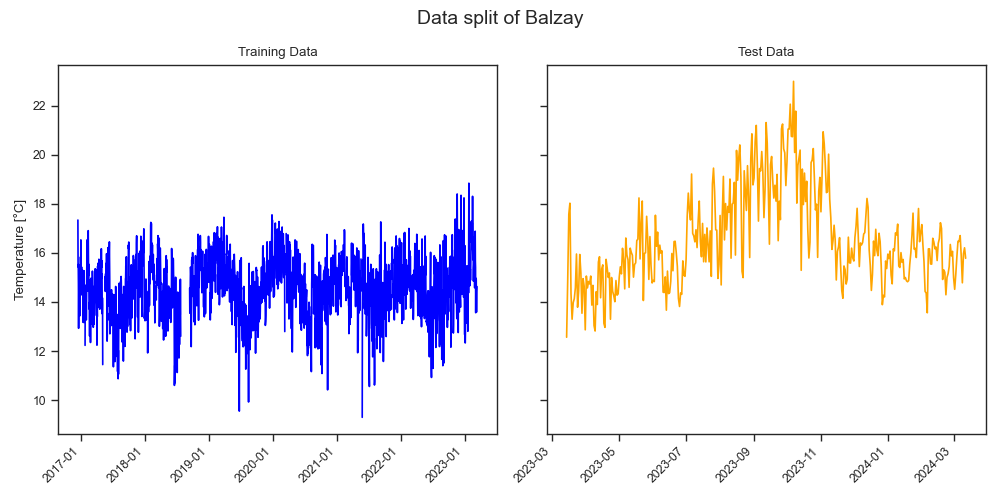

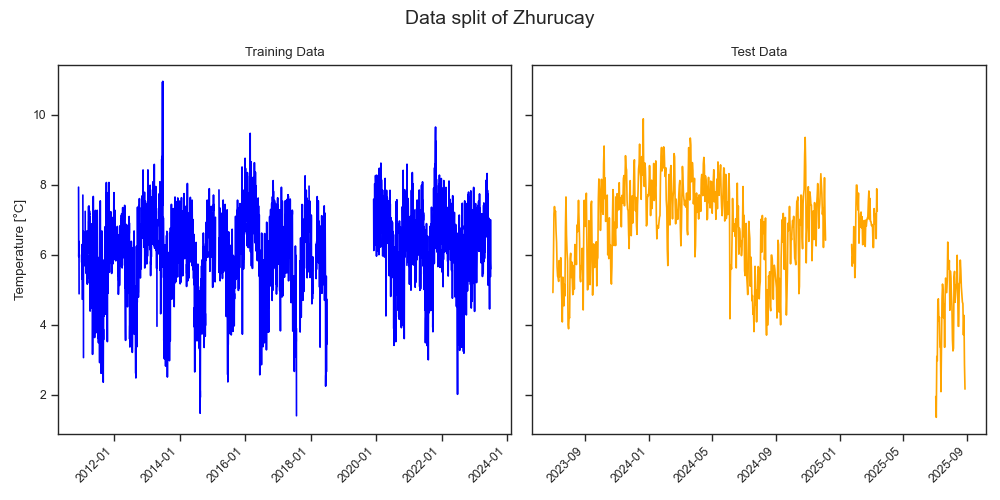

In [56]:
# Chirimachay station has an obvious outlier in 2019, which is removed here 
# (simply filter out values > 12.5 °C based on viual inspection of the Temperature plot):
df = analysis_overview['Temperature']['Chirimachay']['raw']
df.loc[df['AirTC_Avg'] > 12.5, 'AirTC_Avg'] = np.nan

manual_periods_dict = {'Toreadora':{'train_end':'2023-06-30','test_start':'2023-07-01'},
                       'Virgen': {'train_start': '2017-01-01','train_end':'2023-06-30','test_start':'2023-07-01', 'test_end': '2024-10-31'}, 
                       'Zhurucay': {'train_start': '2011-03-01'},
                       'Chirimachay':{'train_end':'2023-06-30','test_start':'2023-07-01'},
                       'Zhurucay':{'train_end':'2023-06-30','test_start':'2023-07-01'}}

# Continue with splitting the data
splitters = {}

importlib.reload(data_split)
for site in sites:
    df = analysis_overview['Temperature'][site]['raw']
    if df is None:
        continue

    splitter = data_split.DataSplitter(df, station_name=site)

    manual_periods = manual_periods_dict.get(site, None)
    
    # Automatically compute train/test periods
    periods = splitter.compute_train_test_periods(min_test_days=365,
                                                  manual_periods=manual_periods)
    
    # Split the data
    splitter.split(periods['train_start'], periods['train_end'],
                   periods['test_start'], periods['test_end'])
    splitter.plot()
    
    # Store in main dict
    analysis_overview['Temperature'][site].update({
        'train_period': [periods['train_start'], periods['train_end']],
        'test_period': [periods['test_start'], periods['test_end']],
        'train': splitter.train_data,
        'test': splitter.test_data,
        'splitter': splitter
    })


### create dictionaries of training and test data

## Inspect frequencies

Inspect frequencies present in datasets

Toreadora training data length: 2353 days


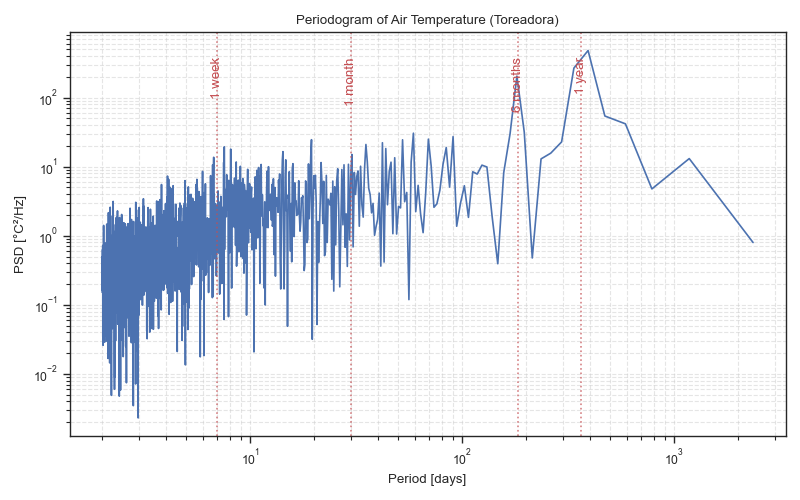

Virgen training data length: 2372 days


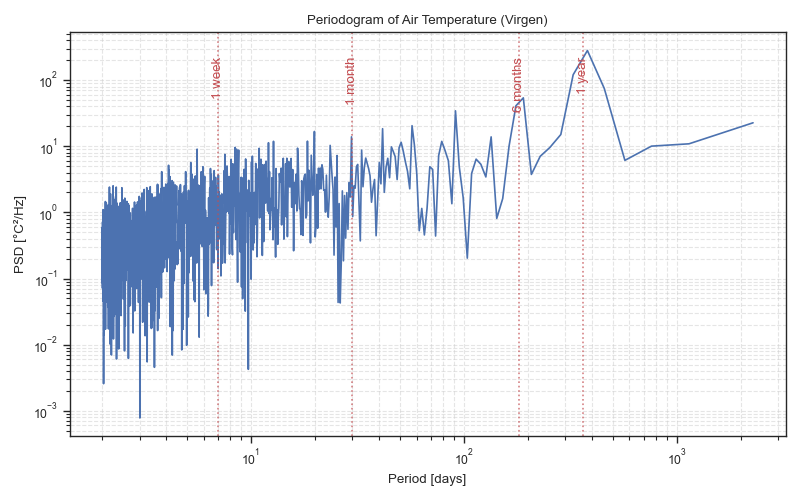

Chirimachay training data length: 2390 days


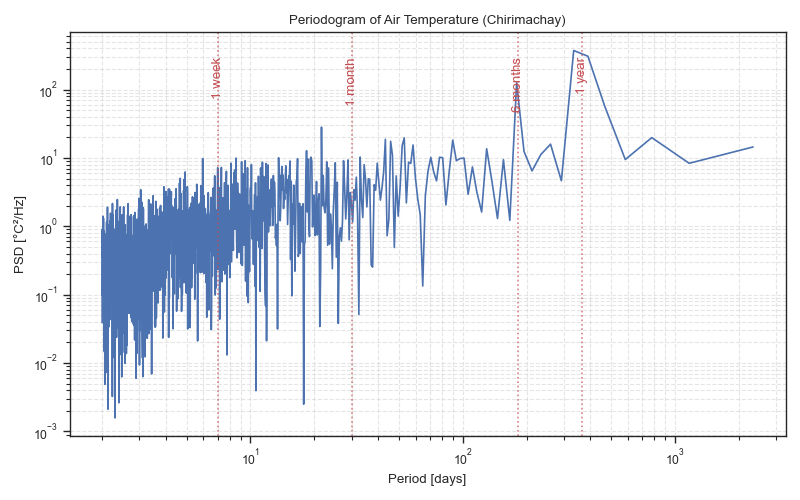

OPNC: No training data available, skipping.
Balzay training data length: 2283 days


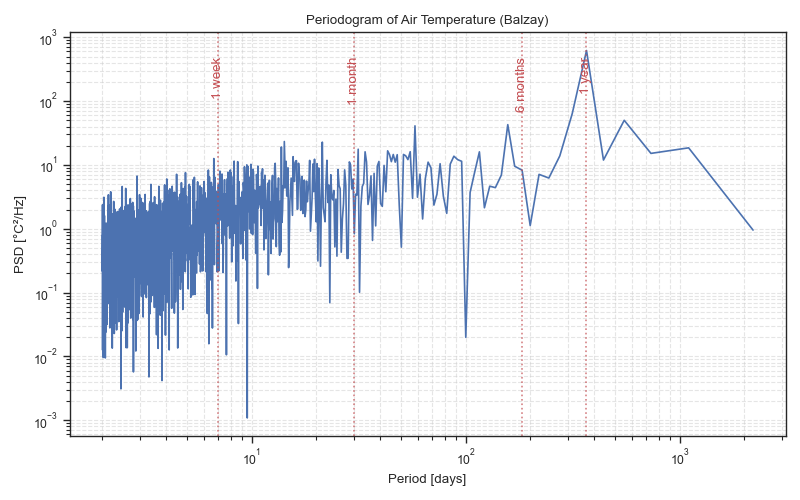

Zhurucay training data length: 4594 days


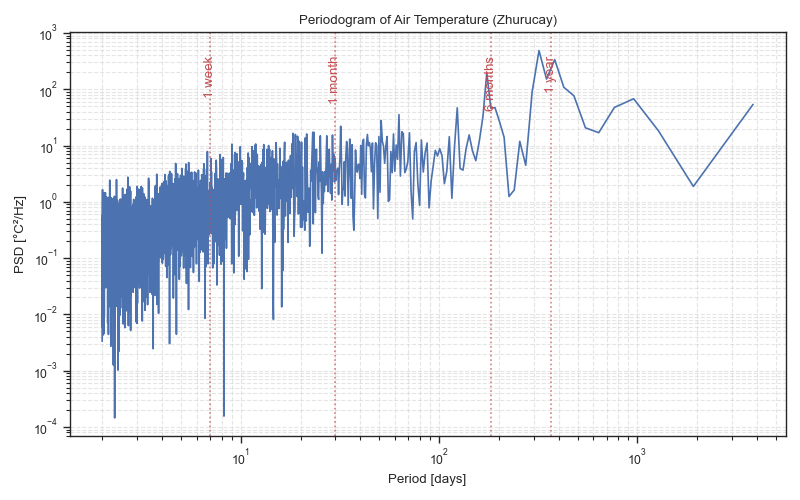

In [57]:
train_dict = {site: analysis_overview['Temperature'][site]['train'] for site in sites}

for station, data in train_dict.items():
    if data is None or data.empty:
        print(f"{station}: No training data available, skipping.")
        continue

    print(f"{station} training data length: {len(data)} days")
    
    try:
        f, Pxx = Inspect_freq(data, station)
    except Exception as e:
        print(f"Error processing {station}: {e}")


## Model creation, refinement and forecasting

The following model setting were applied:
```
model_settings = {
    'level': True,
    'stochast_level': False,
    'irregular':True,
    'trend':True,
    'stochast_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":1}],
    'autoregressive':2
}
``` 

### Toreadora

c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EABD69050>
                           Unobserved Components Results                           
Dep. Variable:                   AirTC_Avg   No. Observations:                 2353
Model:                     fixed intercept   Log Likelihood               -2852.503
                   + freq_seasonal(365(2))   AIC                           5711.007
                                   + AR(2)   BIC                           5728.291
Date:                     Fri, 31 Oct 2025   HQIC                          5717.302
Time:                             16:15:13                                         
Sample:                         01-20-2017                                         
                              - 06-30-2023                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.

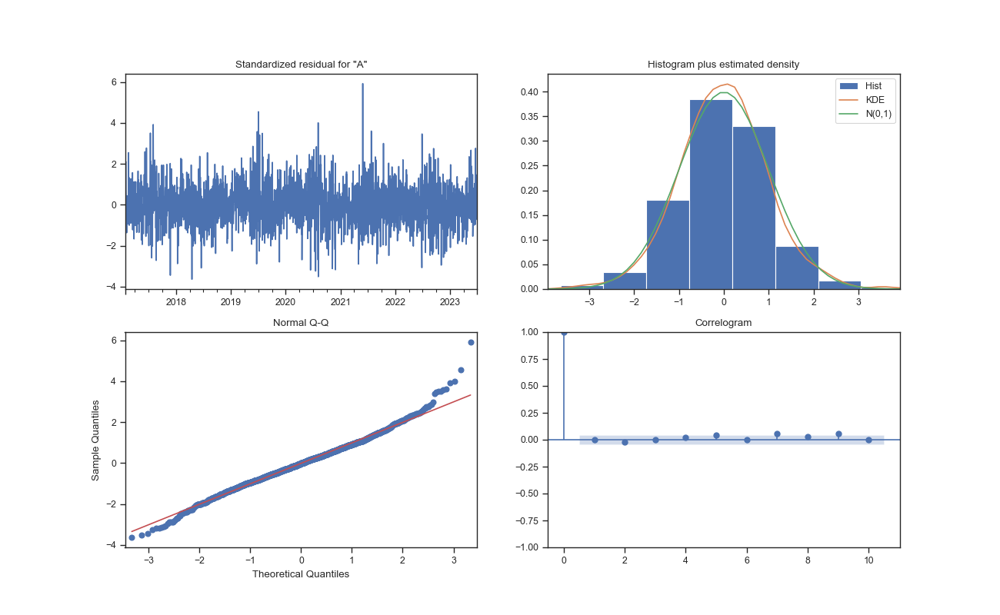

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018EC047EA50>


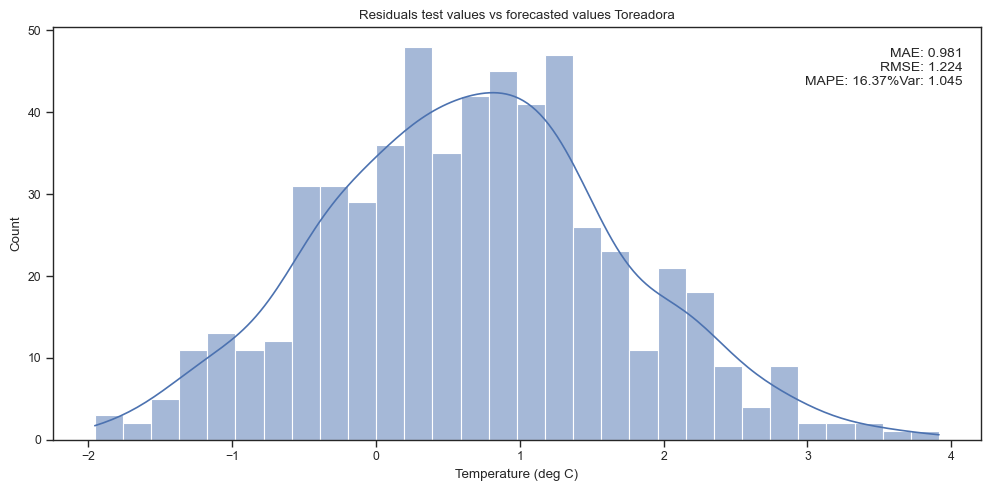

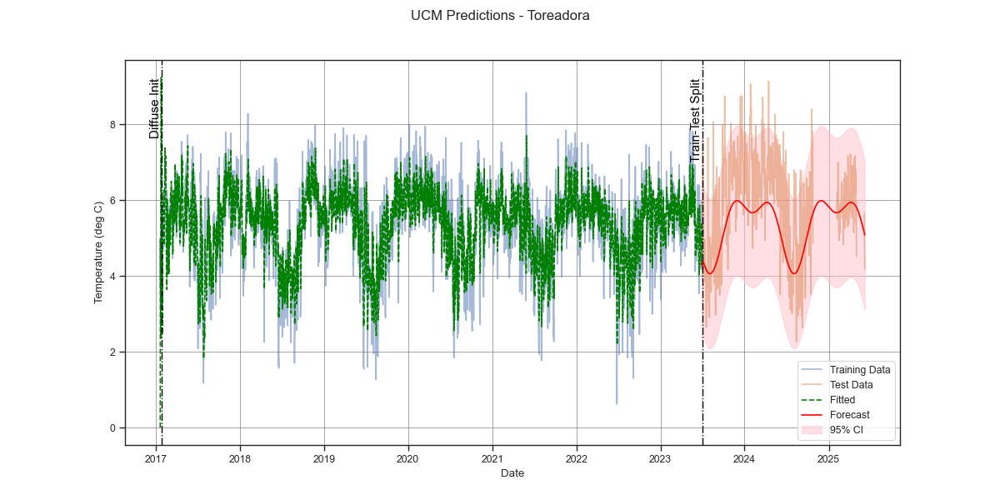


Model Evaluation Metrics:

                    Value
AIC              5711.007
BIC              5728.291
HQIC             5717.302
Log-Likelihood  -2852.503
Total Score     14304.096


In [58]:
Tor_train_data = analysis_overview['Temperature']['Toreadora']['train']
Tor_test_data = analysis_overview['Temperature']['Toreadora']['test']

importlib.reload(UCM)

model_Toreadora = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':2
} 

Toreadora_model = UCM.UnobservedComponentsModel(train_data= Tor_train_data,
                              model_settings= model_Toreadora,
                              station='Toreadora',
                              unit='Temperature (deg C)',
                              test_data= Tor_test_data)

fit_forecast_model('Temperature','Toreadora', model=Toreadora_model, analysis_overview=analysis_overview)

Model 1: -> Model accepted
model_Toreadora = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':2
}
Value
AIC              6592.181
BIC              6609.873
HQIC             6598.580
Log-Likelihood  -3293.090
Total Score     16507.543
MAPE: 12.78%

### Virgen

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EAD7CB050>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                           Unobserved Components Results                           
Dep. Variable:                   AirTC_Avg   No. Observations:                 2372
Model:                                None   Log Likelihood               -2599.654
                   + freq_seasonal(365(2))   AIC                           5203.308
                                   + AR(1)   BIC                           5214.846
Date:                     Fri, 31 Oct 2025   HQIC                          5207.508
Time:                             16:15:15                                         
Sample:                         01-01-2017                                         
                              - 06-30-2023                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
si

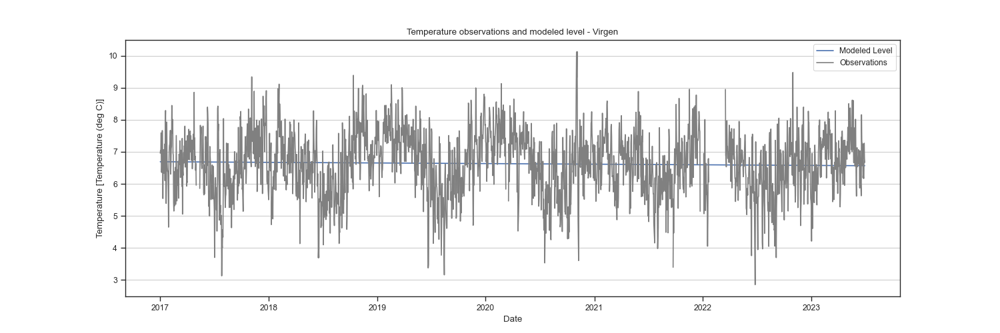

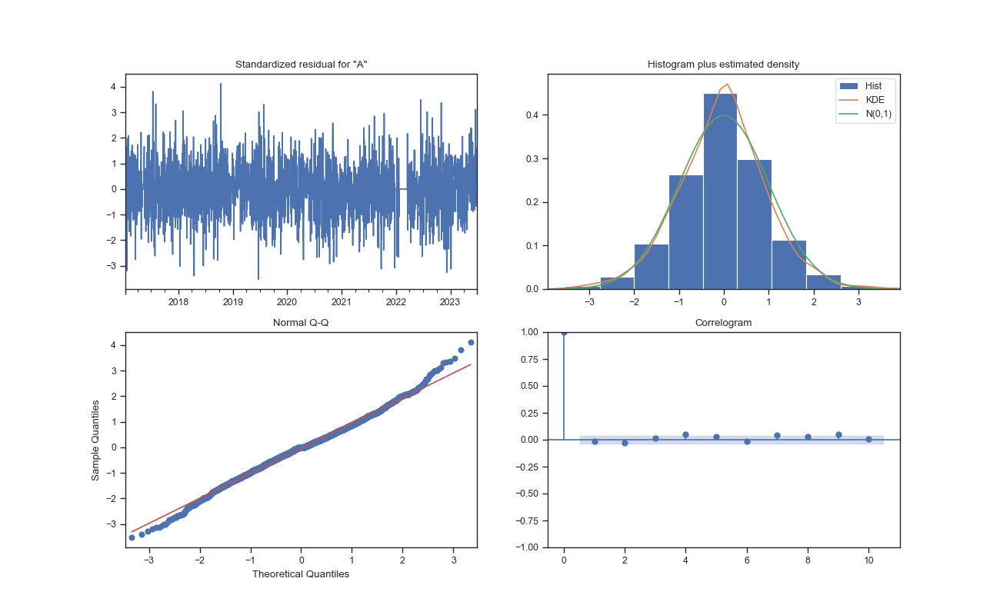

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018EC131EF90>


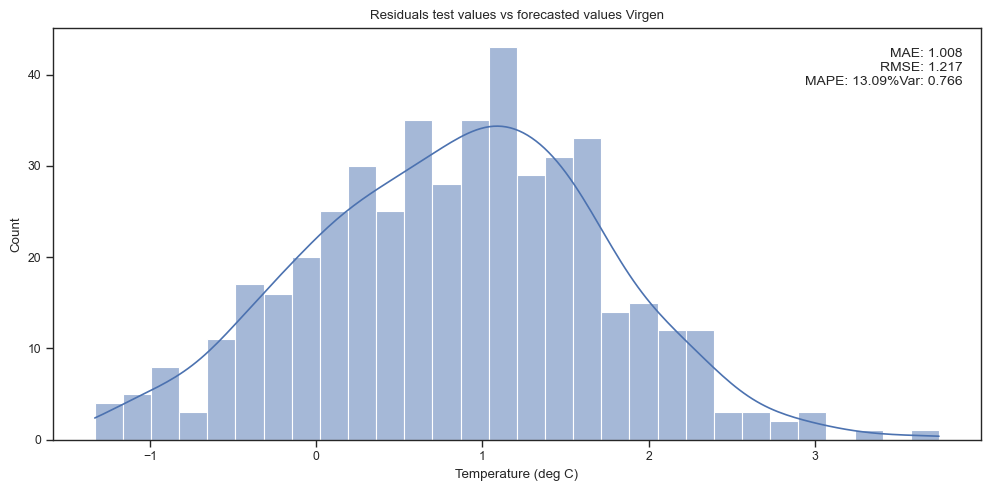

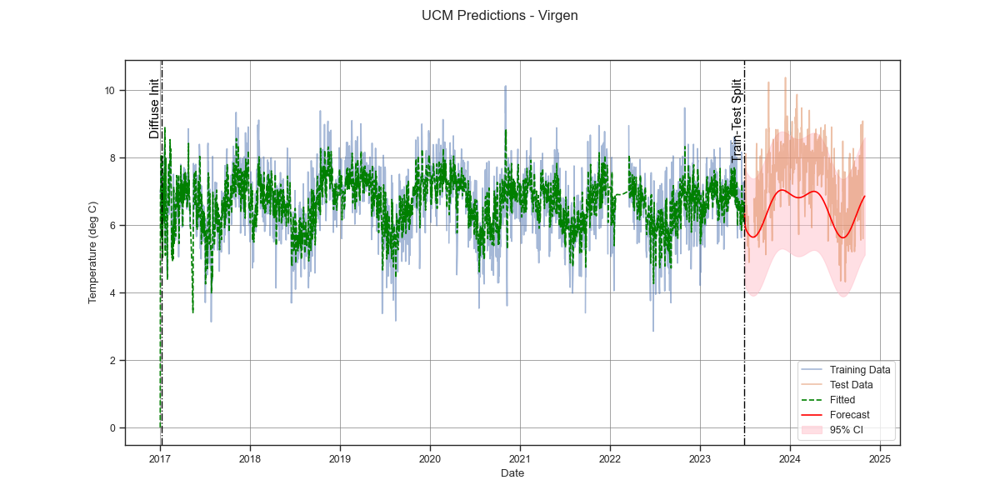


Model Evaluation Metrics:

                    Value
AIC              5203.308
BIC              5214.846
HQIC             5207.508
Log-Likelihood  -2599.654
Total Score     13026.008


In [59]:
Vir_train_data = analysis_overview['Temperature']['Virgen']['train']
Vir_test_data = analysis_overview['Temperature']['Virgen']['test']
importlib.reload(UCM)

model_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':1
} 

Virgen_model = UCM.UnobservedComponentsModel(train_data= Vir_train_data,
                              model_settings= model_Virgen,
                              station='Virgen',
                              unit='Temperature (deg C)',
                              test_data= Vir_test_data)

fit_forecast_model('Temperature','Virgen', model=Virgen_model, analysis_overview=analysis_overview)

Model 1 -> Accepted (not JB)
model_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':1
} 
Value
AIC	5705.471
BIC	5717.195
HQIC	5709.719
Log-Likelihood	-2850.735
Total Score	14281.649
MAPE: 12.41%

Model 2 -> Accepted (not JB)
model_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':1
}
Value
AIC	5724.151
BIC	5735.874
HQIC	5728.399
Log-Likelihood	-2860.075
Total Score	14328.348
MAPE: 11.60%

### Chirimachay

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EC27AC510>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                           Unobserved Components Results                           
Dep. Variable:                   AirTC_Avg   No. Observations:                 2390
Model:                     fixed intercept   Log Likelihood               -2590.636
                   + freq_seasonal(365(2))   AIC                           5187.272
                                   + AR(2)   BIC                           5204.603
Date:                     Fri, 31 Oct 2025   HQIC                          5193.579
Time:                             16:15:17                                         
Sample:                         12-14-2016                                         
                              - 06-30-2023                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
si

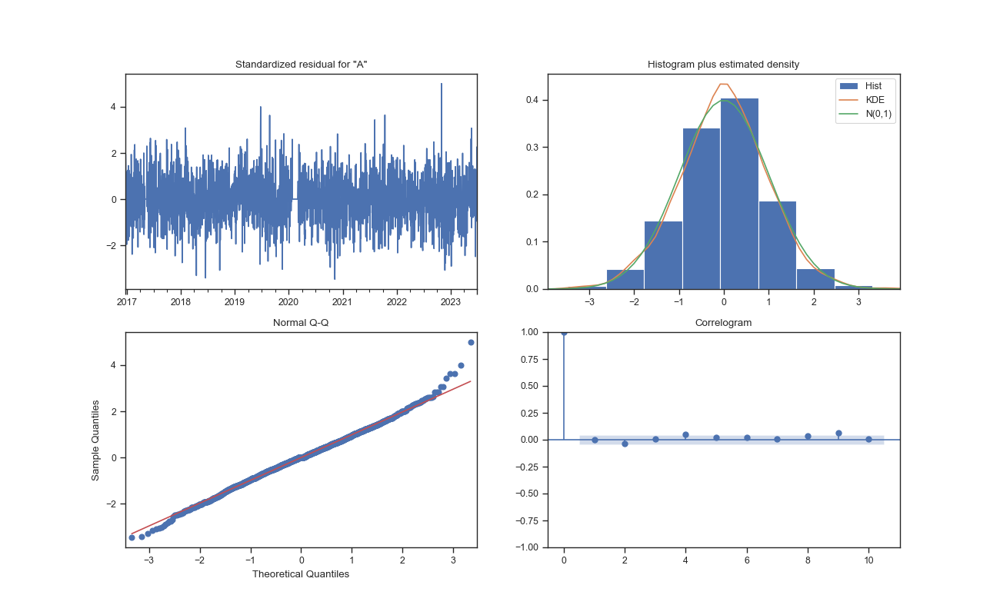

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018EC26A5390>


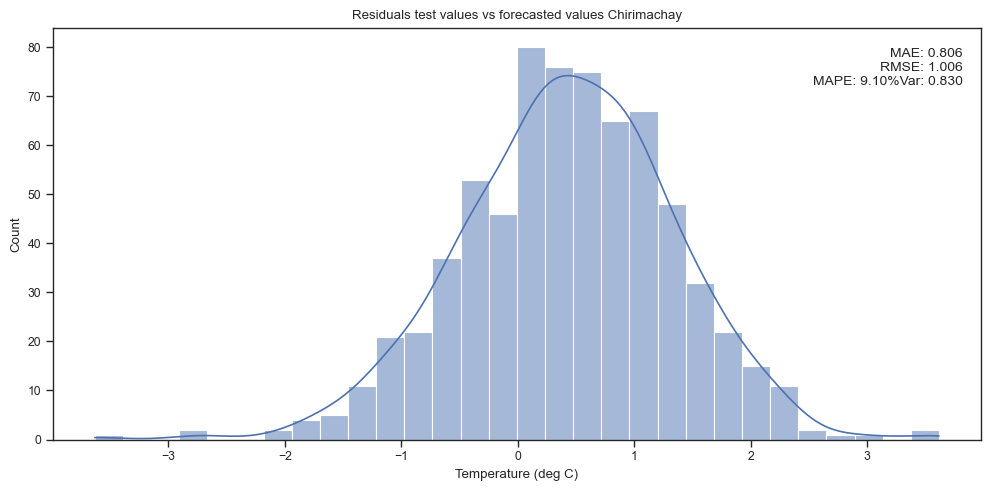

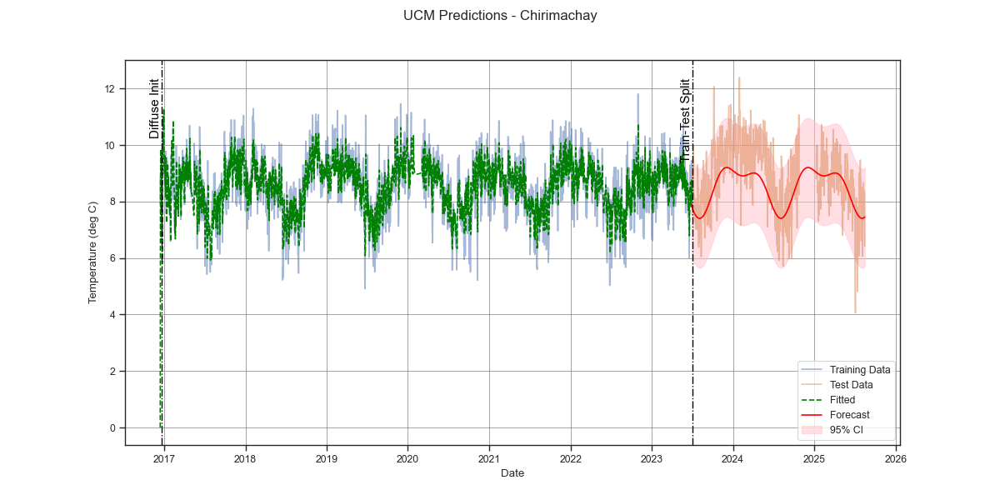


Model Evaluation Metrics:

                    Value
AIC              5187.272
BIC              5204.603
HQIC             5193.579
Log-Likelihood  -2590.636
Total Score     12994.818


In [60]:
Chir_train_data = analysis_overview['Temperature']['Chirimachay']['train']
Chir_test_data = analysis_overview['Temperature']['Chirimachay']['test']

model_Chir = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":365,"harmonics":2,'stochastic': False}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':2
} 

Chir_model = UCM.UnobservedComponentsModel(train_data= Chir_train_data,
                              model_settings= model_Chir,
                              station='Chirimachay',
                              unit='Temperature (deg C)',
                              test_data= Chir_test_data)

fit_forecast_model('Temperature','Chirimachay', model=Chir_model, analysis_overview=analysis_overview)

Model 1: Accepted (not JB)
model_Chir = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2,'stochastic': False}],
    'stochastic_freq_seasonal':[True],
    'autoregressive':2
}
Value
AIC	6157.962
BIC	6181.707
HQIC	6166.533
Log-Likelihood	-3074.981
Total Score	15431.221
MAPE: 10.45%


Model 2: Accpepted (Not JB)
model_Chir = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'freq_seasonal':[{"period":365,"harmonics":2,'stochastic': False}],
    'stochastic_freq_seasonal':[False],
    'autoregressive':2
}
Value
AIC	6174.882
BIC	6192.690
HQIC	6181.310
Log-Likelihood	-3084.441
Total Score	15464.442
MAPE: 8.54%



### Balzay

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EC2F19050>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                             AirTC_Avg   No. Observations:                  327
Model:                               fixed intercept   Log Likelihood                -336.881
                   + stochastic freq_seasonal(52(1))   AIC                            679.761
                                             + AR(1)   BIC                            691.104
Date:                               Fri, 31 Oct 2025   HQIC                           684.289
Time:                                       16:15:20                                         
Sample:                                   12-18-2016                                         
                                        - 03-19-2023                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

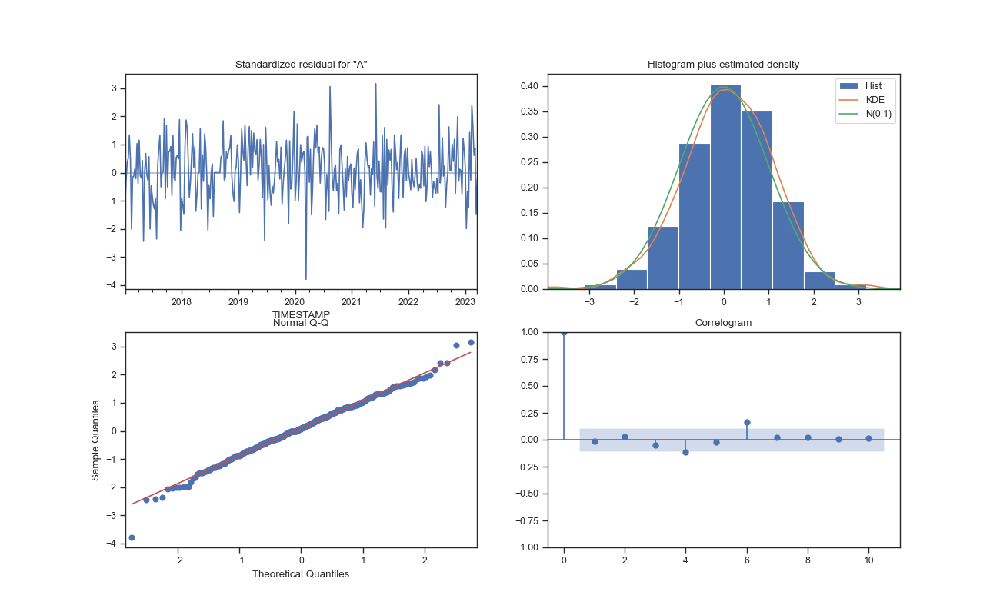

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018E369F6F90>


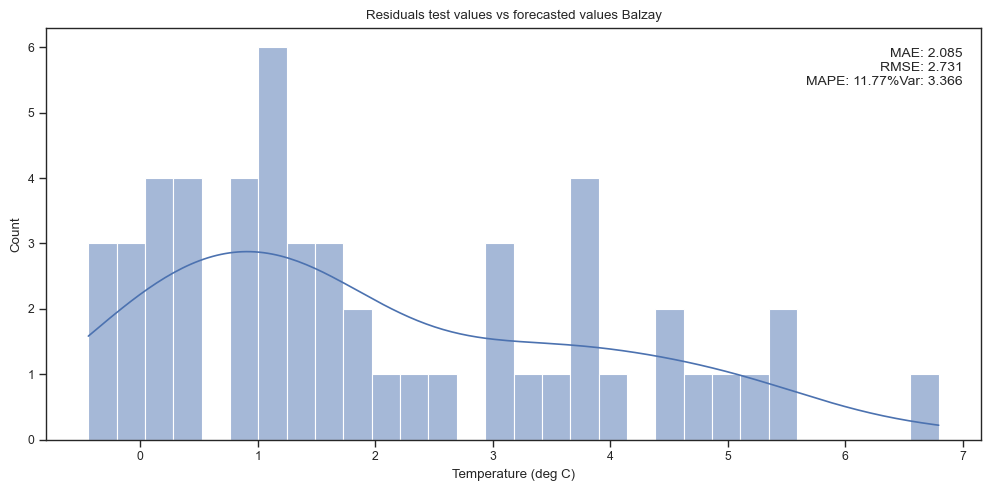

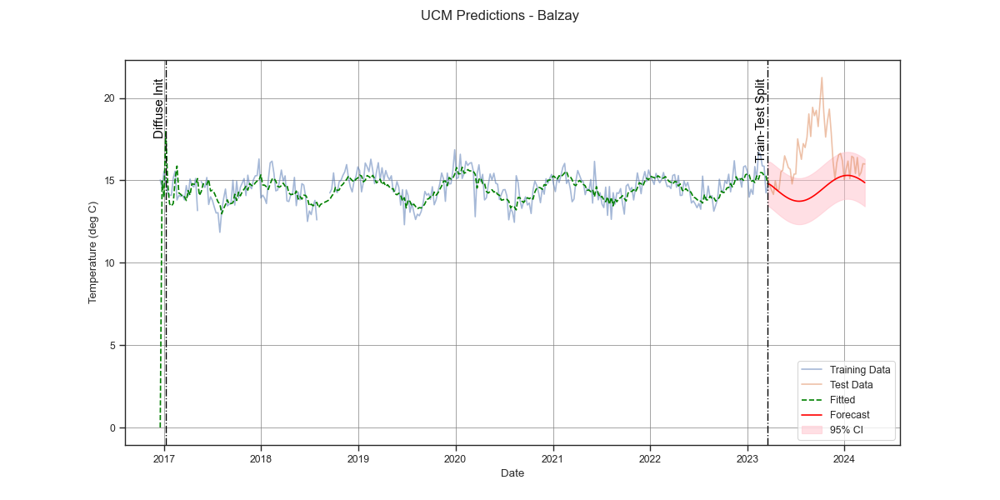


Model Evaluation Metrics:

                   Value
AIC              679.761
BIC              691.104
HQIC             684.289
Log-Likelihood  -336.881
Total Score     1718.273


In [61]:
Balz_train_data = analysis_overview['Temperature']['Balzay']['train']
Balz_train_data = Balz_train_data.resample('W').mean()
Balz_test_data = analysis_overview['Temperature']['Balzay']['test']
Balz_test_data = Balz_test_data.resample('W').mean()

model_Balz = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'stochastic_freq_seasonal':[True],
    'autoregressive':1
} 

Balz_model = UCM.UnobservedComponentsModel(train_data= Balz_train_data,
                              model_settings= model_Balz,
                              station='Balzay',
                              unit='Temperature (deg C)',
                              test_data= Balz_test_data)

fit_forecast_model('Temperature','Balzay', model=Balz_model, analysis_overview=analysis_overview)

### Zhurucay

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EBFAB03D0>
                                Unobserved Components Results                                
Dep. Variable:                             AirTC_Avg   No. Observations:                  151
Model:                                          None   Log Likelihood                 -78.279
                   + stochastic freq_seasonal(12(2))   AIC                            164.558
                                             + AR(2)   BIC                            176.465
Date:                               Fri, 31 Oct 2025   HQIC                           169.396
Time:                                       16:15:22                                         
Sample:                                   12-31-2010                                         
                                        - 06-30-2023                                         
Covariance Type:                                 opg     

c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


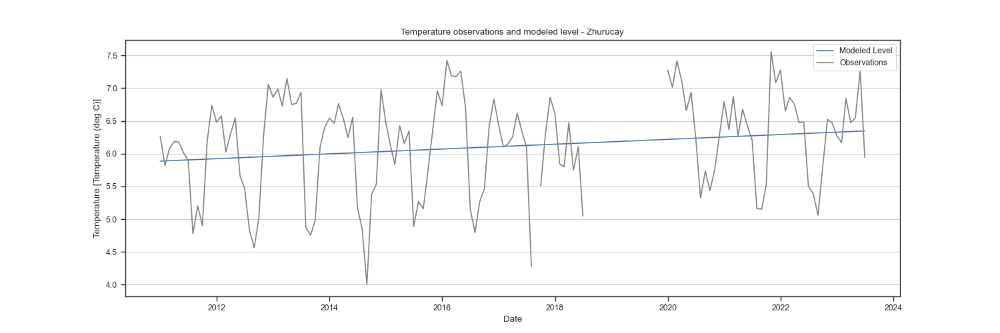

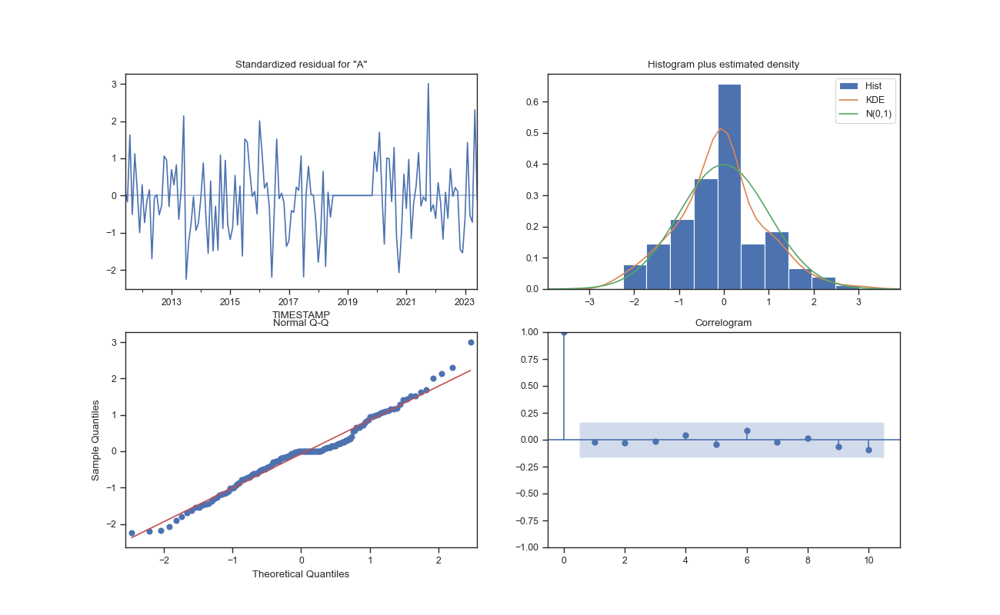

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018E93D56F90>


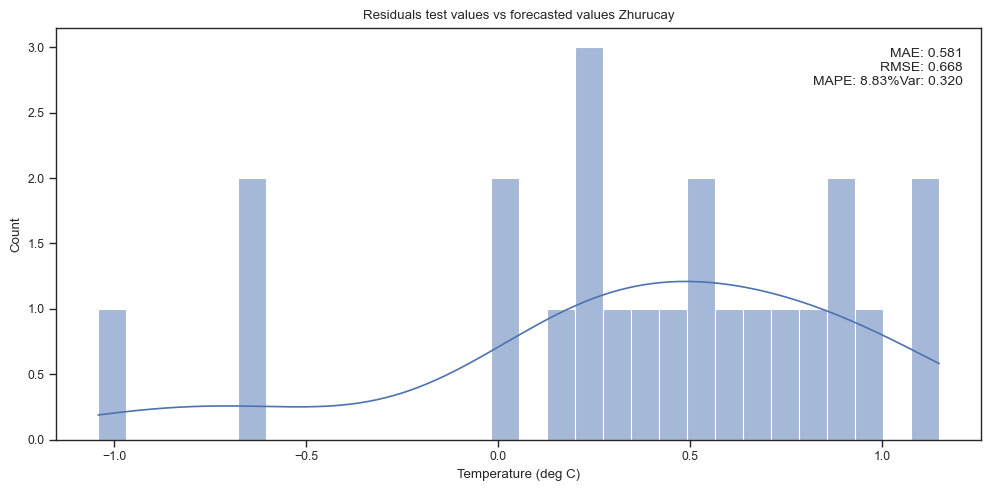

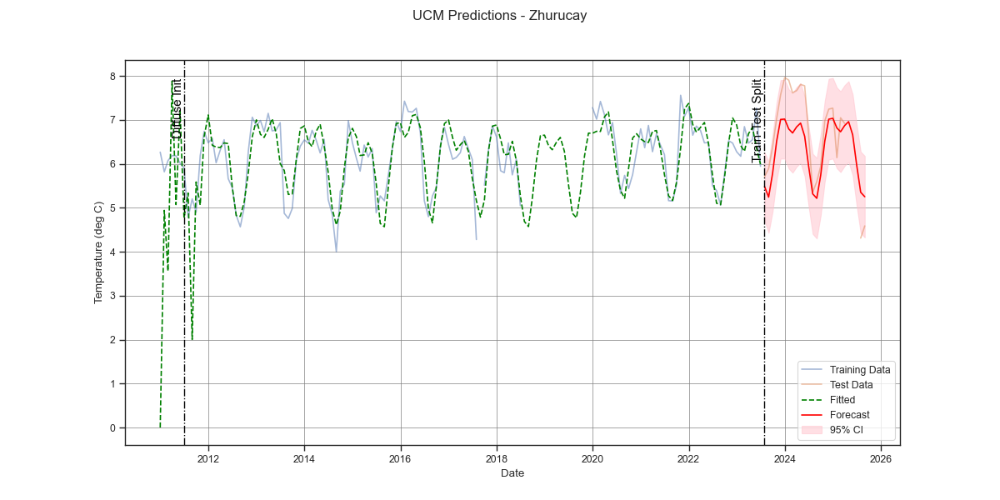


Model Evaluation Metrics:

                  Value
AIC             164.558
BIC             176.465
HQIC            169.396
Log-Likelihood  -78.279
Total Score     432.139


In [62]:
Zhur_train_data = analysis_overview['Temperature']['Zhurucay']['train']
Zhur_train_data = Zhur_train_data.resample('ME').mean()
Zhur_test_data = analysis_overview['Temperature']['Zhurucay']['test']
Zhur_test_data = Zhur_test_data.resample('ME').mean()

model_Zhur = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':2
} 

Zhur_model = UCM.UnobservedComponentsModel(train_data= Zhur_train_data,
                              model_settings= model_Zhur,
                              station='Zhurucay',
                              unit='Temperature (deg C)',
                              test_data= Zhur_test_data)

fit_forecast_model('Temperature','Zhurucay', model=Zhur_model, analysis_overview=analysis_overview)

- The result of Heteroskaticity test is failed in various ways, try to do it with monthly data

Model 1: Accpeted
model_Zhur_M= {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1}],
    'autoregressive':1
} 
Value
AIC	187.200
BIC	196.151
HQIC	190.837
Log-Likelihood	-90.600
Total Score	483.589
MAPE: 12.88%

Model 2: Accepted
model_Zhur_M= {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':1
}
Value
AIC	146.240
BIC	155.149
HQIC	149.860
Log-Likelihood	-70.120
Total Score	381.129
MAPE: 13.45%
-> comment: altought error of predictions is better this is also the outlier year. fit score of model consderably better!

Model 3: Accepted
model_Zhur_M= {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':1
}
Value
AIC	154.471
BIC	163.360
HQIC	158.083
Log-Likelihood	-74.236
Total Score	401.679
MAPE: 9.82%
Comment -> better fit in test data! More data needed to evaluate if there is a trend present.

Model 4:
model_Zhur_M= {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':2
} 
Value
AIC	148.102
BIC	159.953
HQIC	152.918
Log-Likelihood	-70.051
Total Score	390.922
MAPE: 10.20%
Comment -> fit of test data slightly worse. better overall fit score.

# Precipitation Data

Group into monthly data (sum per month) and remove 0 values as there is a low chance that no rain falls in a full month.

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_18832\2868883389.py:7: DtypeWarning: Columns (2,4,6,7,9,11,14,15,18,20,22,24,25,26,29,30,31,32,34,36,40,42,45,47,50,51) have mixed types. Specify dtype option on import or set low_memory=False.
  Balzay_P_data = pd.read_csv("../../data/Quinuas/Balzay_full.csv")


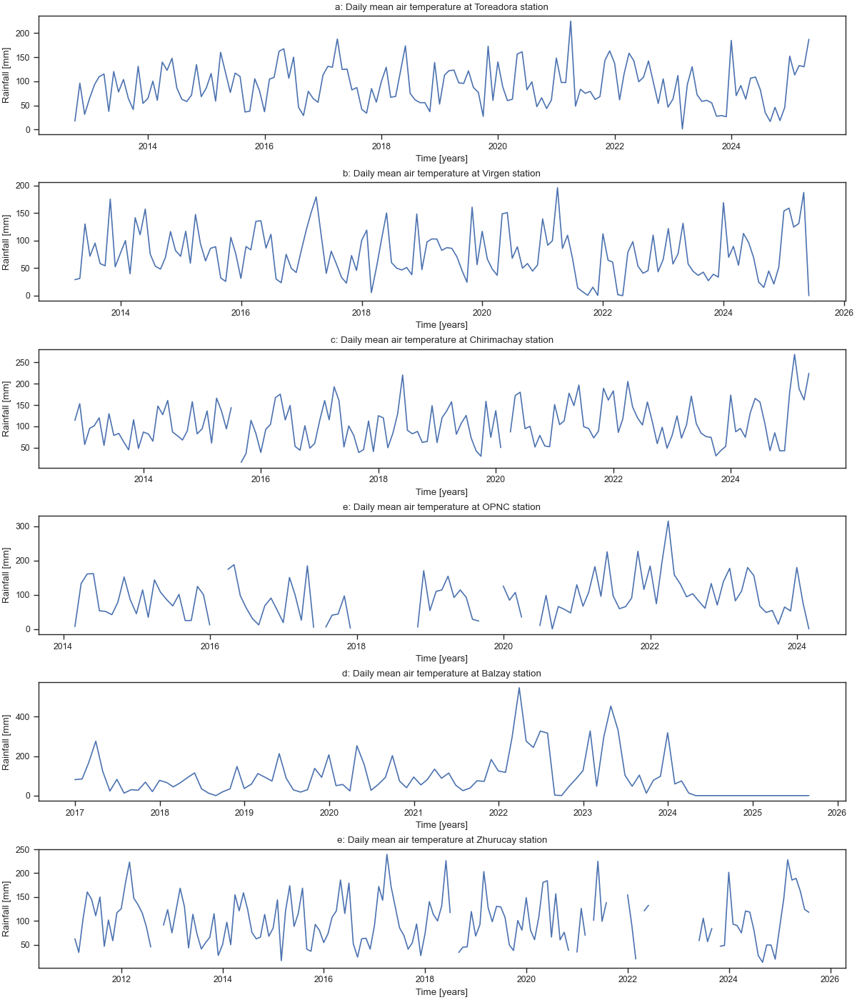

In [63]:
Zhur_P_day = pd.read_csv(f"../../data/Zhurucay/Precipitation/Unidos_Zhu_PT13_Diario_05_12_2010_17_07_2025.csv")
Zhur_P_day['Fecha'] = pd.to_datetime(Zhur_P_day['Fecha'])
Zhur_P_data = Zhur_P_day.resample('ME', on='Fecha').sum()
Zhur_P_data[Zhur_P_data['Valor_mm_day']<10] = np.nan
analysis_overview['Precipitation']['Zhurucay']['raw'] = Zhur_P_data

Balzay_P_data = pd.read_csv("../../data/Quinuas/Balzay_full.csv")
Balzay_P_data = Balzay_P_data[['TIMESTAMP', 'Rain_mm_Tot']]
Balzay_P_data.loc[Balzay_P_data['Rain_mm_Tot'] > 2, 'Rain_mm_Tot']  = np.nan
Balzay_P_data['TIMESTAMP'] = pd.to_datetime(Balzay_P_data['TIMESTAMP'], errors='coerce')
Balzay_P_data = Balzay_P_data.resample('ME', on='TIMESTAMP').sum()
#Balzay_P_data['Rain_mm_Tot'] = Balzay_P_data['Rain_mm_Tot'].replace(0, np.nan)
analysis_overview['Precipitation']['Balzay']['raw'] = Balzay_P_data

Chirimachay_P_data = pd.read_csv("../../data/Quinuas/Precipitation/Chirimachay/Datos_unidos_corregidos_Chirimachay_Texas_5min_05_2025.csv")
Chirimachay_P_data['Fecha'] = pd.to_datetime(Chirimachay_P_data['Fecha'], errors='coerce')
Chirimachay_P_data = Chirimachay_P_data.resample('ME', on='Fecha').sum() 
Chirimachay_P_data['tip_corrected_mm'] = Chirimachay_P_data['tip_corrected_mm'].replace(0, np.nan)
analysis_overview['Precipitation']['Chirimachay']['raw'] = Chirimachay_P_data

Toreadora_P_data = pd.read_csv("../../data/Quinuas/Precipitation/Toreadora/Datos_unidos_corregidos_Toreadora_Texas_5min_05_2025.csv")
Toreadora_P_data['Fecha'] = pd.to_datetime(Toreadora_P_data['Fecha'], errors='coerce')
Toreadora_P_data = Toreadora_P_data.resample('ME', on='Fecha').sum()   
Toreadora_P_data['tip_corrected_mm'] = Toreadora_P_data['tip_corrected_mm'].replace(0, np.nan)
analysis_overview['Precipitation']['Toreadora']['raw'] = Toreadora_P_data

Virgen_P_data = pd.read_csv("../../data/Quinuas/Precipitation/Virgen/Datos_unidos_corregidos_Virgen_Texas_5min_05_2025.csv")
Virgen_P_data['Fecha'] = pd.to_datetime(Virgen_P_data['Fecha'],errors='coerce')
Virgen_P_data = Virgen_P_data.resample('ME', on='Fecha').sum()
Virgen_P_data['tip_corrected_mm'] = Virgen_P_data['tip_corrected_mm'].replace(0, np.nan)
analysis_overview['Precipitation']['Virgen']['raw'] = Virgen_P_data

OPNC_P_data = pd.read_csv("../../data/Quinuas/Precipitation/OPNC/Datos_unidos_corregidos_OPNC_5min.csv")
OPNC_P_data['Fecha'] = pd.to_datetime(OPNC_P_data['Fecha'],errors='coerce')
OPNC_P_data = OPNC_P_data.resample('ME', on='Fecha').sum()
OPNC_P_data['tip_corrected_mm'] = OPNC_P_data['tip_corrected_mm'].replace(0, np.nan)
analysis_overview['Precipitation']['OPNC']['raw'] = OPNC_P_data

# PLot temperature data
fig,ax = plt.subplots(nrows=6,figsize=(12,14),layout="constrained")
#fig.suptitle('Daily mean air temperature at Quinuas stations', fontsize=16)

ax[0].plot(Toreadora_P_data['tip_corrected_mm'], label='Toreadora')
ax[0].title.set_text('a: Daily mean air temperature at Toreadora station')
ax[0].set_ylabel('Rainfall [mm]')
ax[0].set_xlabel('Time [years]')

ax[1].plot(Virgen_P_data['tip_corrected_mm'], label='Virgen')
ax[1].title.set_text('b: Daily mean air temperature at Virgen station')
ax[1].set_ylabel('Rainfall [mm]')
ax[1].set_xlabel('Time [years]')

ax[2].plot(Chirimachay_P_data['tip_corrected_mm'], label='Virgen')
ax[2].title.set_text('c: Daily mean air temperature at Chirimachay station')
ax[2].set_ylabel('Rainfall [mm]')   
ax[2].set_xlabel('Time [years]')

ax[3].plot(OPNC_P_data['tip_corrected_mm'], label='OPNC')
ax[3].title.set_text('e: Daily mean air temperature at OPNC station')
ax[3].set_ylabel('Rainfall [mm]')
ax[3].set_xlabel('Time [years]')

ax[4].plot(Balzay_P_data['Rain_mm_Tot'], label='Balzay')
ax[4].title.set_text('d: Daily mean air temperature at Balzay station')
ax[4].set_ylabel('Rainfall [mm]')
ax[4].set_xlabel('Time [years]')

ax[5].plot(Zhur_P_data['Valor_mm_day'], label='Zhurucay')
ax[5].title.set_text('e: Daily mean air temperature at Zhurucay station')
ax[5].set_ylabel('Rainfall [mm]')
ax[5].set_xlabel('Time [years]')

fig.tight_layout
plt.show()

## Clean & divide dataset

In [64]:
splitters = {}

manual_periods_dict = {'Toreadora':{'train_start':'2017-01-31','test_start':'2024-05-31'},
                       'Balzay':{'train_end':'2023-02-28', 'test_start':'2023-03-31', 'test_end':'2024-03-31'}}
importlib.reload(data_split)
for site in sites:
    df = analysis_overview['Precipitation'][site]['raw']
    if df is None:
        continue
    
    
    splitter = data_split.DataSplitter(df, station_name=site)
    manual_periods = manual_periods_dict.get(site, None)
    # Automatically compute train/test periods
    periods = splitter.compute_train_test_periods(min_test_days=365, manual_periods=manual_periods)
    
    # Split the data
    splitter.split(periods['train_start'], periods['train_end'],
                   periods['test_start'], periods['test_end'])
    #splitter.plot()
    
    # Store in main dict
    analysis_overview['Precipitation'][site].update({
        'train_period': [periods['train_start'], periods['train_end']],
        'test_period': [periods['test_start'], periods['test_end']],
        'train': splitter.train_data,
        'test': splitter.test_data,
        'splitter': splitter
    })


## Model creation, refinement and forecasting

### Toreadora

In [65]:
Tor_T_month = Toreadora_T_data.resample('ME').mean()

train_dates = analysis_overview['Precipitation']['Toreadora']['train_period']
test_dates = analysis_overview['Precipitation']['Toreadora']['test_period']

Tor_T_train = Tor_T_month.loc[train_dates[0]:train_dates[1]]
Tor_T_test = Tor_T_month.loc[test_dates[0]:test_dates[1]].interpolate()

exog_vars = Tor_T_train
exog_vars_future = Tor_T_test

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EB5964A10>
                            Unobserved Components Results                            
Dep. Variable:              tip_corrected_mm   No. Observations:                   89
Model:                                  None   Log Likelihood                -400.277
                   + stochastic seasonal(12)   AIC                            808.553
                                     + AR(1)   BIC                            817.876
Date:                       Fri, 31 Oct 2025   HQIC                           812.279
Time:                               16:16:16                                         
Sample:                           01-31-2017                                         
                                - 05-31-2024                                         
Covariance Type:                         opg                                         
                      coef    std err      

c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


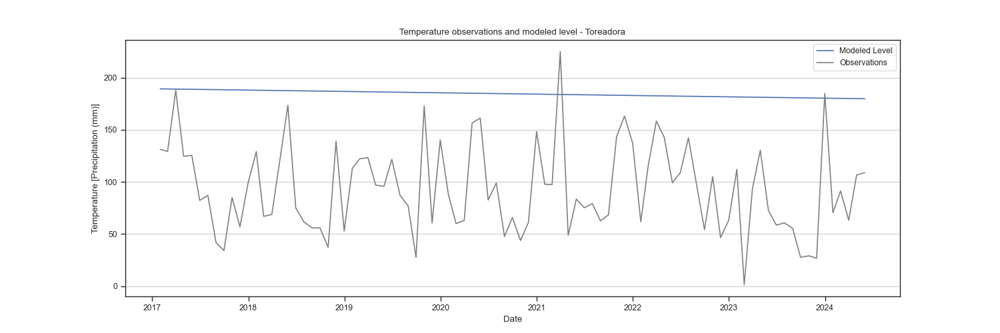

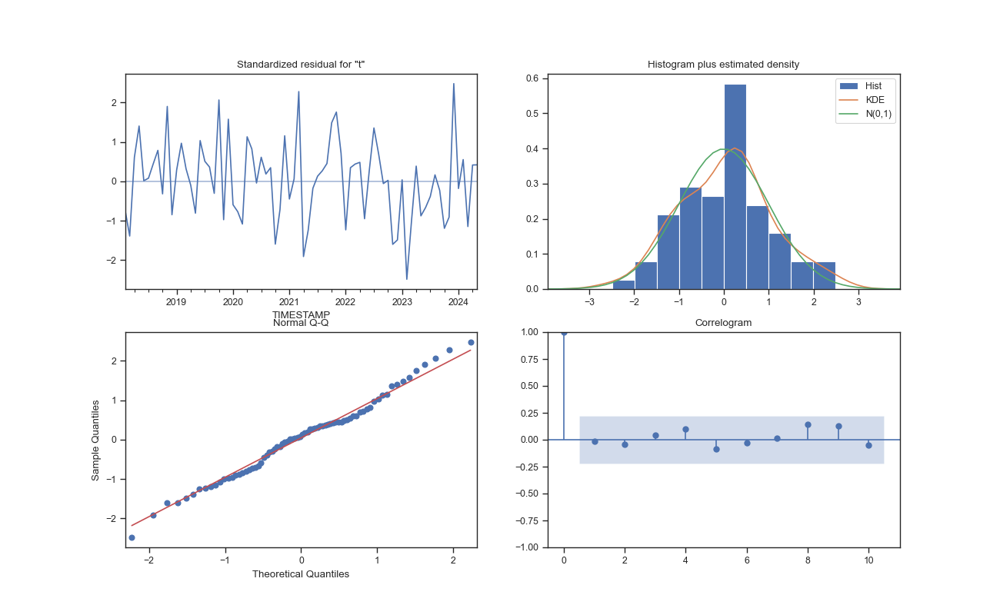

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018E36ACF8D0>


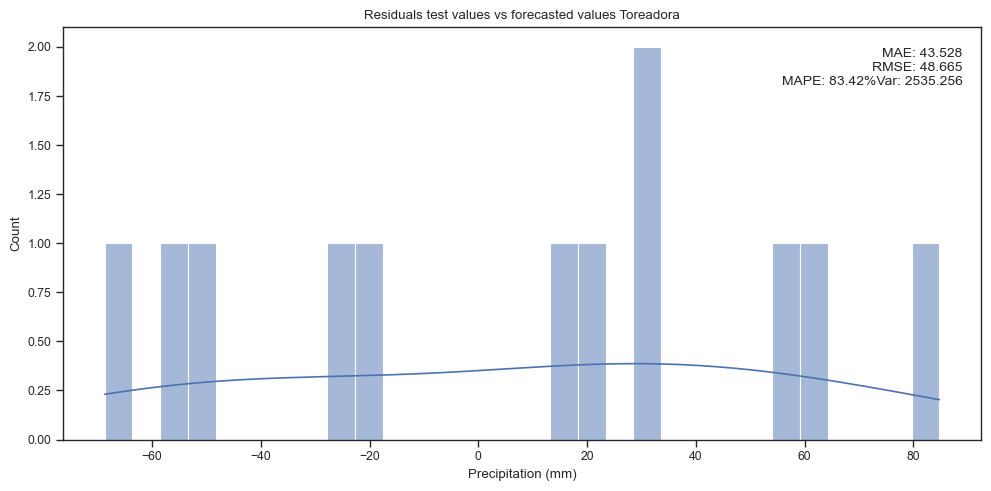

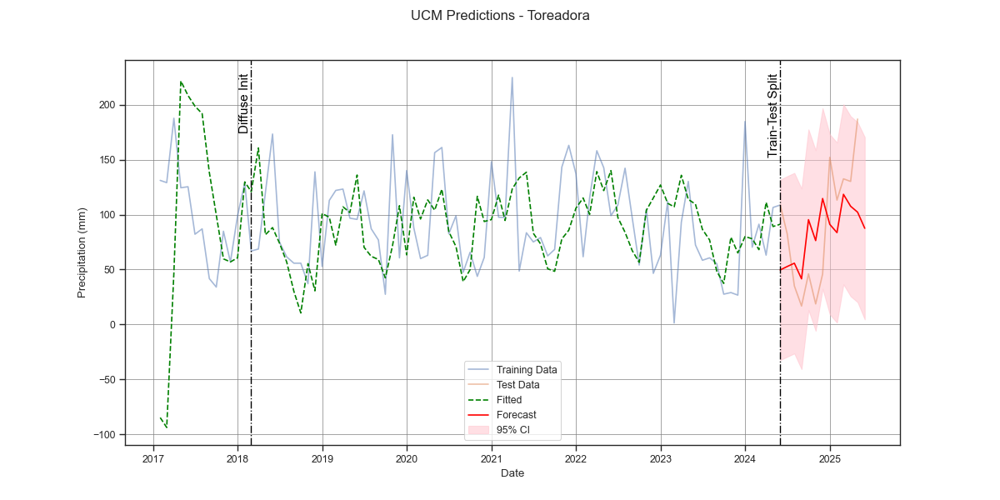


Model Evaluation Metrics:

                   Value
AIC              808.553
BIC              817.876
HQIC             812.279
Log-Likelihood  -400.277
Total Score     2038.431


In [66]:
Tor_train_data = analysis_overview['Precipitation']['Toreadora']['train']
Tor_test_data = analysis_overview['Precipitation']['Toreadora']['test']
                                                                       
model_P_Toreadora = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'irregular':False,
    'cycle':False,
    'stochastic_cycle':False,
    'seasonal':12,
    'autoregressive':1,
    'exog': exog_vars
} 

Tor_P_model = UCM.UnobservedComponentsModel(train_data= Tor_train_data,
                              model_settings= model_P_Toreadora,
                              station='Toreadora',
                              unit='Precipitation (mm)',
                              test_data= Tor_test_data)

fit_forecast_model('Precipitation','Toreadora', model=Tor_P_model, analysis_overview=analysis_overview, exog_vars_future=exog_vars_future)

#### Using exog
Model 1 -> passed all tests!
model_P_Toreadora = {
    'level': True,
    'stochastic_level':True,
    'trend':True,
    'stochastic_trend':False,
    'irregular':False,
    'cycle':False,
    'stochastic_cycle':False,
    'seasonal':12,
    'autoregressive':1,
    'exog': exog_vars
}
Value
AIC              810.553
BIC              822.207
HQIC             815.211
Log-Likelihood  -400.277
Total Score     2047.694
MAPE: 83.44%

Model 2 -> Passed all tests
model_P_Toreadora = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'irregular':False,
    'cycle':False,
    'stochastic_cycle':False,
    'seasonal':12,
    'autoregressive':1,
    'exog': exog_vars
}
Value
AIC              808.553
BIC              817.876
HQIC             812.279
Log-Likelihood  -400.277
Total Score     2038.431
MAPE: 83.42%
Comments -> slightly better score and MAPE.

**Decision:** Model 2 is best for forecasting and does have a slightly higher model score. All tests are passed using a temperature regressor.

### Virgen

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018F36246ED0>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                            Unobserved Components Results                            
Dep. Variable:              tip_corrected_mm   No. Observations:                  135
Model:                                  None   Log Likelihood                -632.856
                   + stochastic seasonal(12)   AIC                           1271.712
                                     + AR(1)   BIC                           1280.124
Date:                       Fri, 31 Oct 2025   HQIC                          1275.129
Time:                               16:16:18                                         
Sample:                           03-31-2013                                         
                                - 05-31-2024                                         
Covariance Type:                         opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

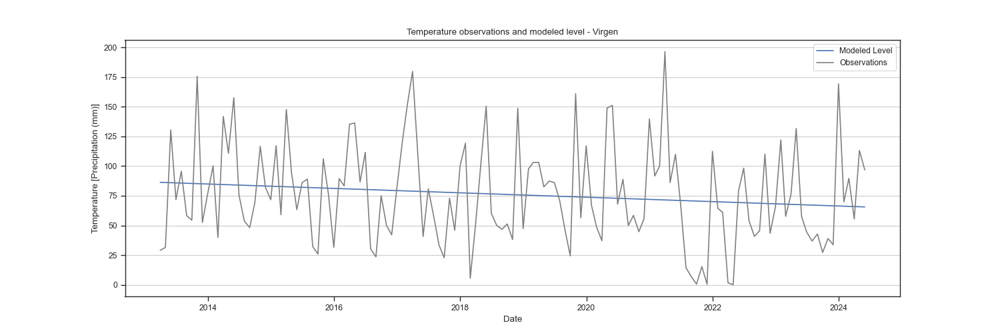

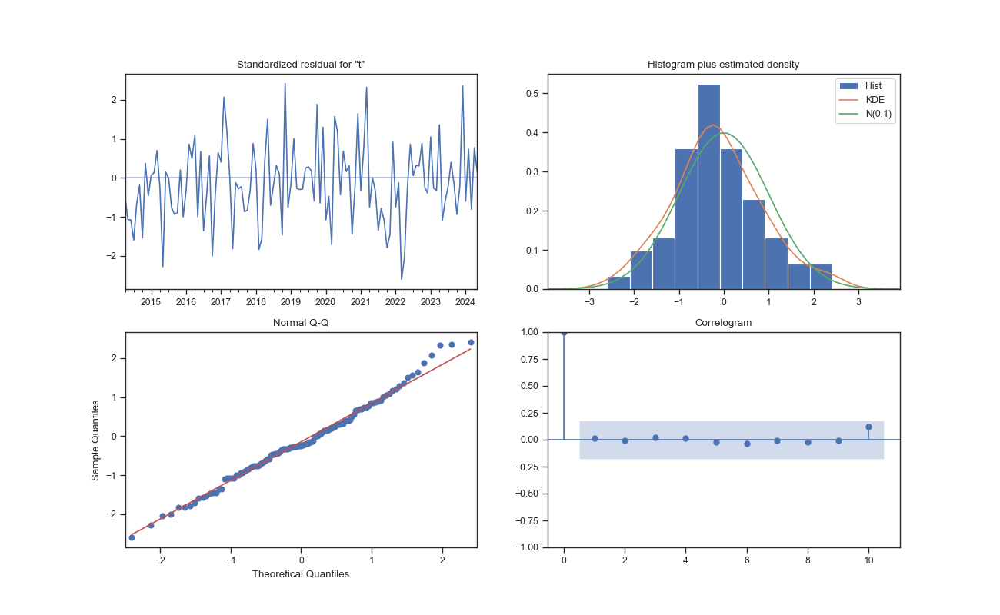

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018E65BB6F90>


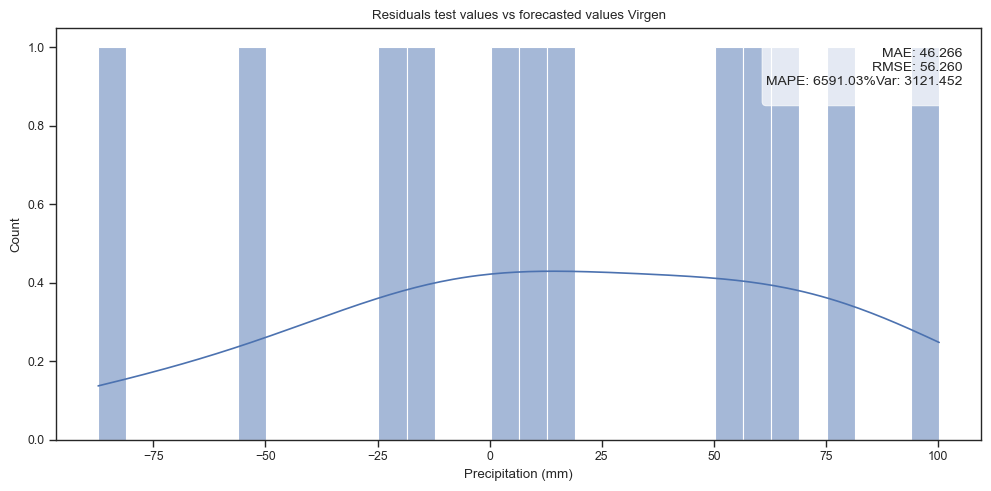

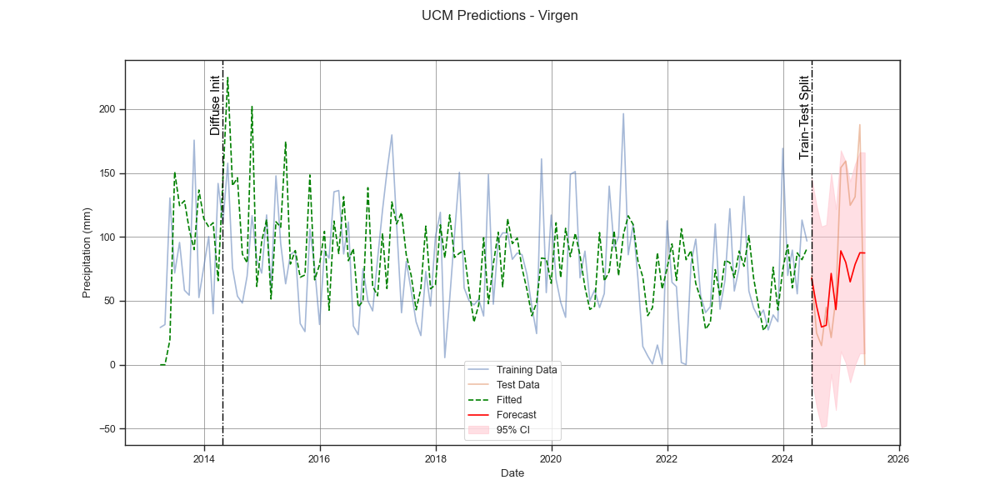


Model Evaluation Metrics:

                   Value
AIC             1271.712
BIC             1280.124
HQIC            1275.129
Log-Likelihood  -632.856
Total Score     3194.109


In [67]:
Vir_train_data = analysis_overview['Precipitation']['Virgen']['train']
Vir_test_data = analysis_overview['Precipitation']['Virgen']['test']

importlib.reload(UCM)

model_P_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
} 

Vir_P_model = UCM.UnobservedComponentsModel(train_data= Vir_train_data,
                              model_settings= model_P_Virgen,               
                              station='Virgen',
                              unit='Precipitation (mm)',
                              test_data= Vir_test_data)



fit_forecast_model('Precipitation','Virgen', model=Vir_P_model, analysis_overview=analysis_overview)

Model 1 -> All tests passed.
model_P_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
} 
Value
AIC             1271.712
BIC             1280.124
HQIC            1275.129
Log-Likelihood  -632.856
Total Score     3194.109
RMSE: 56
Average trend (mm per year): -5.5966

Model 2 -> All tests passed
model_P_Virgen = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    #'seasonal':12,
    'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
} 
Value
AIC             1346.560
BIC             1355.139
HQIC            1350.046
Log-Likelihood  -670.280
Total Score     3381.465
RMSE 56 -> Model one is better.

Model 1 best.

### Chirimachay

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018E59736710>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                            Unobserved Components Results                            
Dep. Variable:              tip_corrected_mm   No. Observations:                  140
Model:                                  None   Log Likelihood                -647.216
                   + stochastic seasonal(12)   AIC                           1300.431
                                     + AR(1)   BIC                           1308.964
Date:                       Fri, 31 Oct 2025   HQIC                          1303.898
Time:                               16:16:20                                         
Sample:                           10-31-2012                                         
                                - 05-31-2024                                         
Covariance Type:                         opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

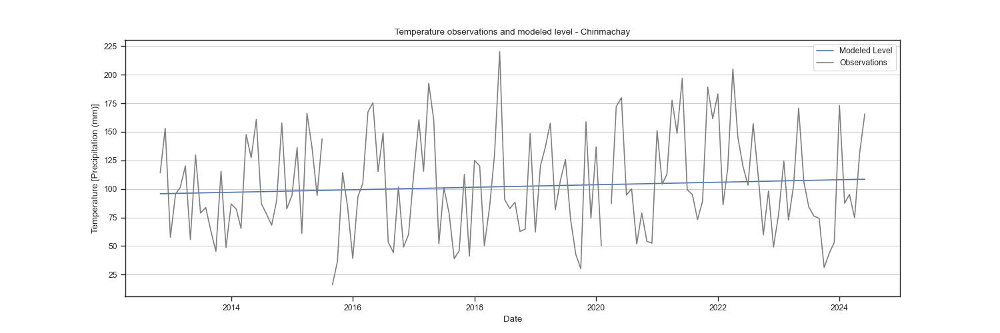

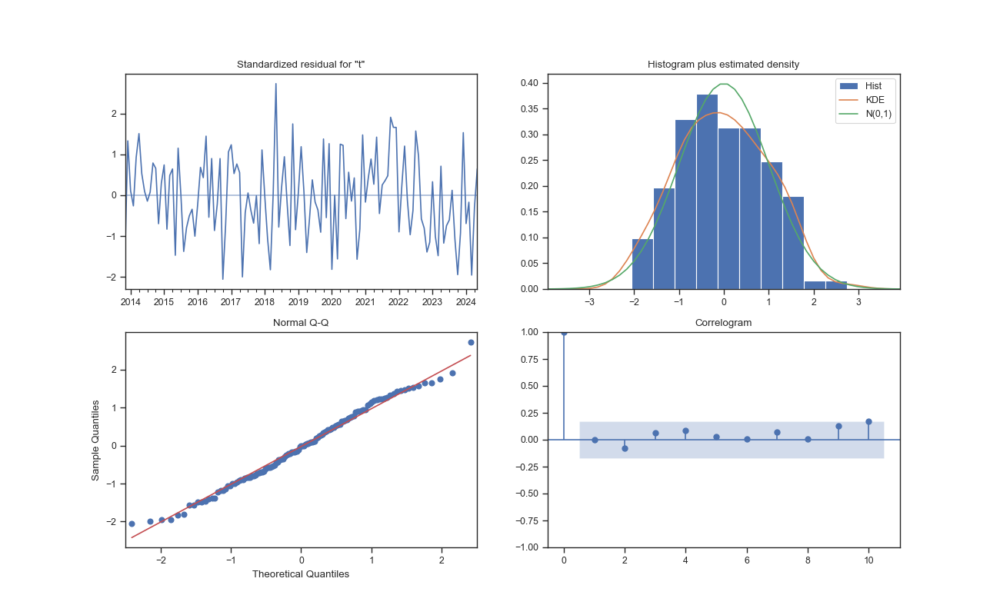

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018F349CAF10>


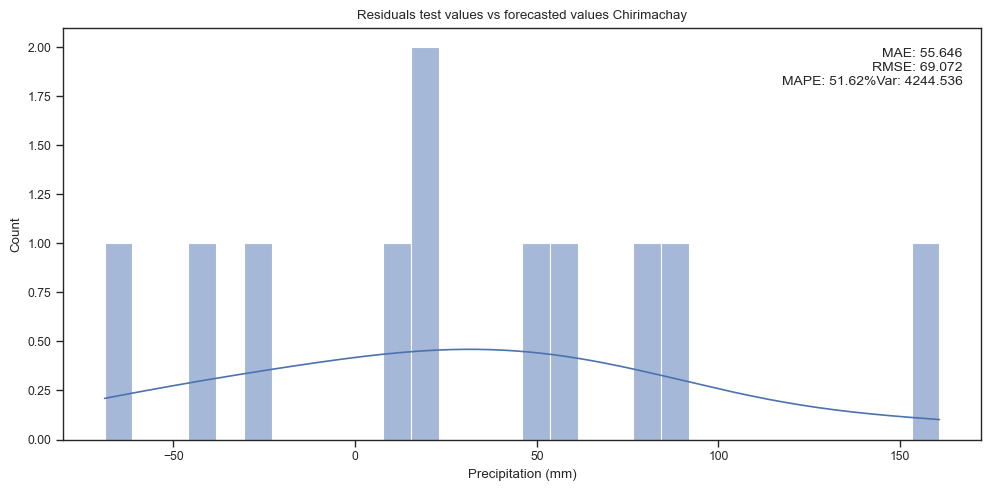

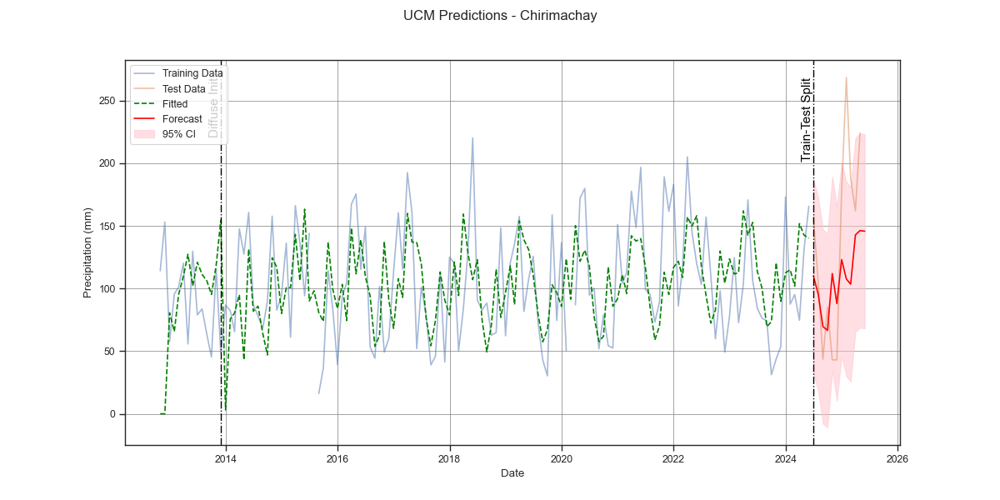


Model Evaluation Metrics:

                   Value
AIC             1300.431
BIC             1308.964
HQIC            1303.898
Log-Likelihood  -647.216
Total Score     3266.078


In [68]:
Chir_train_data = analysis_overview['Precipitation']['Chirimachay']['train']
Chir_test_data = analysis_overview['Precipitation']['Chirimachay']['test']

model_P_Chirimachay = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
} 

Chir_P_model = UCM.UnobservedComponentsModel(train_data= Chir_train_data,
                              model_settings= model_P_Chirimachay,               
                              station='Chirimachay',
                              unit='Precipitation (mm)',
                              test_data= Chir_test_data)

fit_forecast_model('Precipitation','Chirimachay', model=Chir_P_model, analysis_overview=analysis_overview)

Model 1: -> all test statistics passed
    {'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
}
Value
AIC             1300.431
BIC             1308.964
HQIC            1303.898
Log-Likelihood  -647.216
Total Score     3266.078
MAPE: 51.62%

Model 2 -> all tests passed
model_P_Chirimachay = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
}
Value
AIC             1303.482
BIC             1312.038
HQIC            1306.958
Log-Likelihood  -648.741
Total Score     3273.737
MAPE: 50.5%
Commment -> slightly better forecast but worse model score.



**Selection:** Model 1 best as there is a minimal improvement in forecasting ability with model 2 but model one has a better score

### OPNC

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018F2F140E50>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                            Unobserved Components Results                            
Dep. Variable:              tip_corrected_mm   No. Observations:                  110
Model:                          random trend   Log Likelihood                -429.266
                   + stochastic seasonal(12)   AIC                            868.532
                                     + cycle   BIC                            881.301
                                     + AR(1)   HQIC                           873.692
Date:                       Fri, 31 Oct 2025                                         
Time:                               16:16:21                                         
Sample:                           01-31-2014                                         
                                - 02-28-2023                                         
Covariance Type:                         opg                                         
                      coef    std err          z      

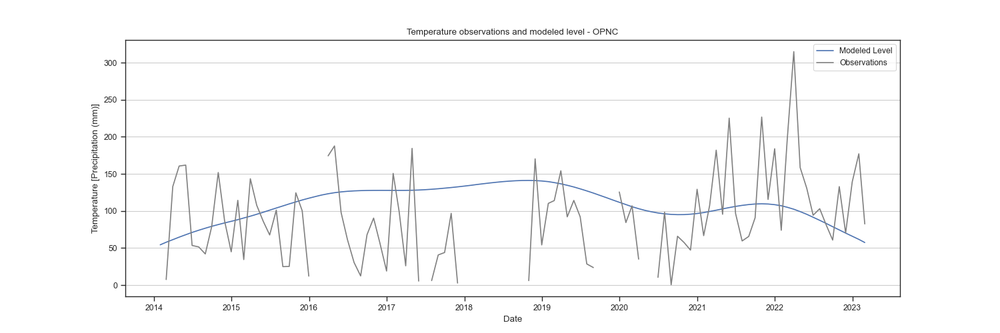

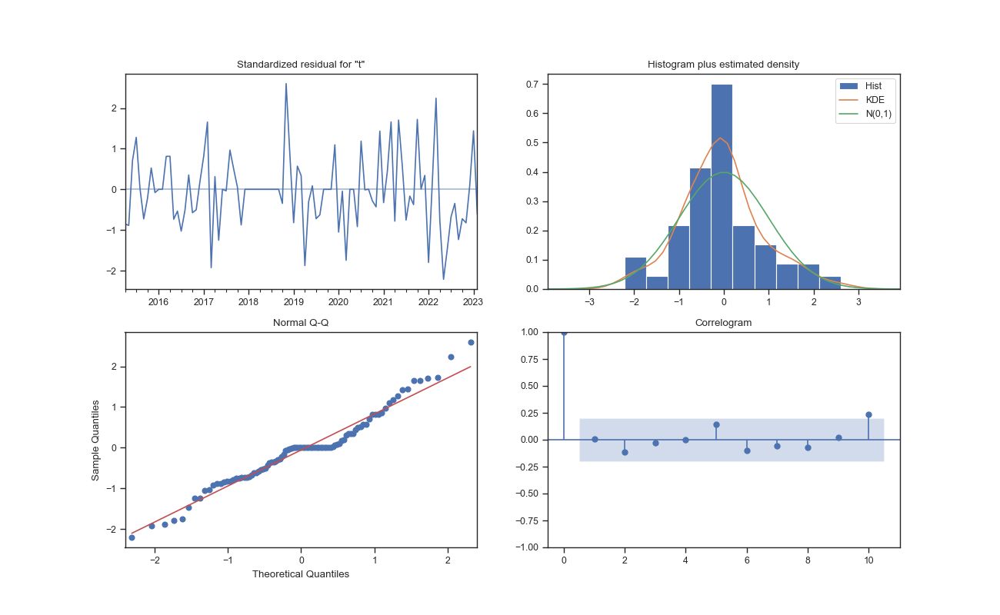

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018F21D66F90>


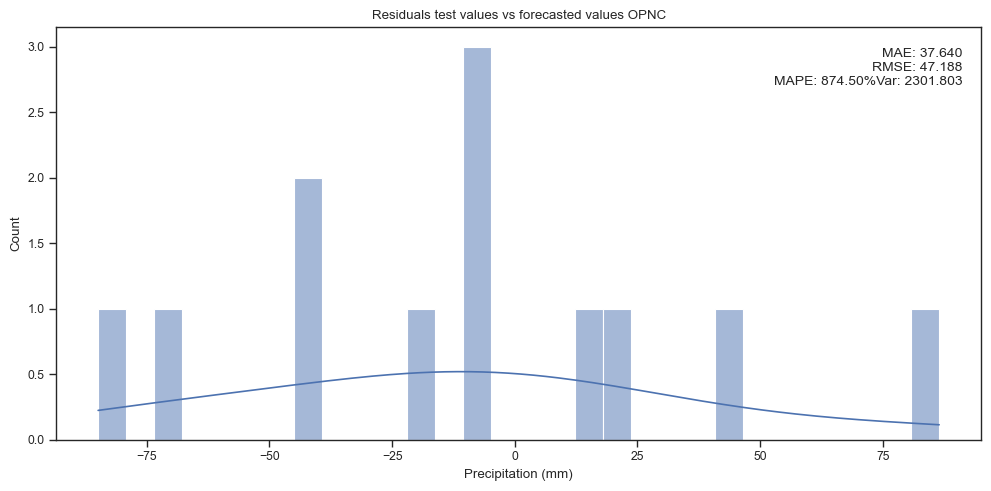

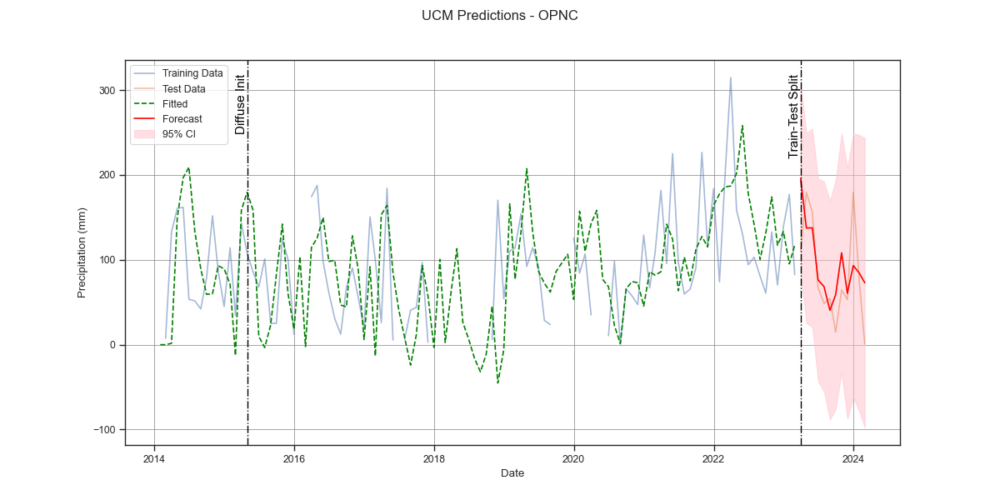


Model Evaluation Metrics:

                   Value
AIC              868.532
BIC              881.301
HQIC             873.692
Log-Likelihood  -429.266
Total Score     2194.259


In [69]:
OPNC_train_data = analysis_overview['Precipitation']['OPNC']['train']
OPNC_test_data = analysis_overview['Precipitation']['OPNC']['test']

model_P_OPNC = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':True,
    'stochastic_cycle':False,
    'seasonal':12,
    #'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1
}

OPNC_P_model = UCM.UnobservedComponentsModel(train_data= OPNC_train_data,
                              model_settings= model_P_OPNC,               
                              station='OPNC',
                              unit='Precipitation (mm)',
                              test_data= OPNC_test_data)

fit_forecast_model('Precipitation','OPNC', model=OPNC_P_model, analysis_overview=analysis_overview)

Model 1: All tests accepted
    {'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':True,
    #'seasonal':12,
    'freq_seasonal':[{'period':12,'harmonics':2}],
    'autoregressive':1,
}
Value
AIC              945.124
BIC              958.248
HQIC             950.438
Log-Likelihood  -467.562
Total Score     2386.249
RMSE: 49.90mm

Model 2 -> all tests passed
model_P_OPNC = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':True,
    'stochastic_cycle':False,
    'seasonal':12,
    'autoregressive':1
}
Value
AIC              868.532
BIC              881.301
HQIC             873.692
Log-Likelihood  -429.266
Total Score     2194.259
RMSE: 47.18



### Balzay

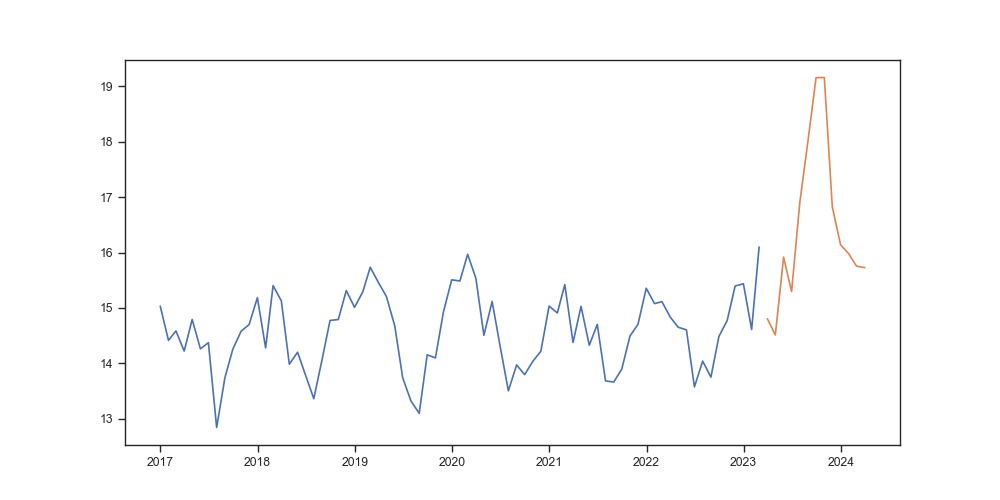

In [70]:
Balz_T_month = Balzay_T_data.resample('ME').mean()

train_dates = analysis_overview['Precipitation']['Balzay']['train_period']
test_dates = analysis_overview['Precipitation']['Balzay']['test_period']

Balz_T_train = Balz_T_month.loc[train_dates[0]:train_dates[1]].interpolate()
Balz_T_test = Balz_T_month.loc[test_dates[0]:test_dates[1]].interpolate()

exog_vars = Balz_T_train
exog_vars_future = Balz_T_test

fig,ax = plt.subplots(figsize=(10,5))
ax.plot(exog_vars.index, exog_vars)
ax.plot(exog_vars_future.index, exog_vars_future)
plt.show()

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018F0D8EE250>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                           Rain_mm_Tot   No. Observations:                   75
Model:                                   random walk   Log Likelihood                -418.166
                   + stochastic freq_seasonal(12(1))   AIC                            848.332
                                             + cycle   BIC                            861.823
                                             + AR(1)   HQIC                           853.691
Date:                               Fri, 31 Oct 2025                                         
Time:                                       16:16:23                                         
Sample:                                   12-31-2016                                         
                                        - 02-28-2023                                         
Covariance Type:                                 opg        

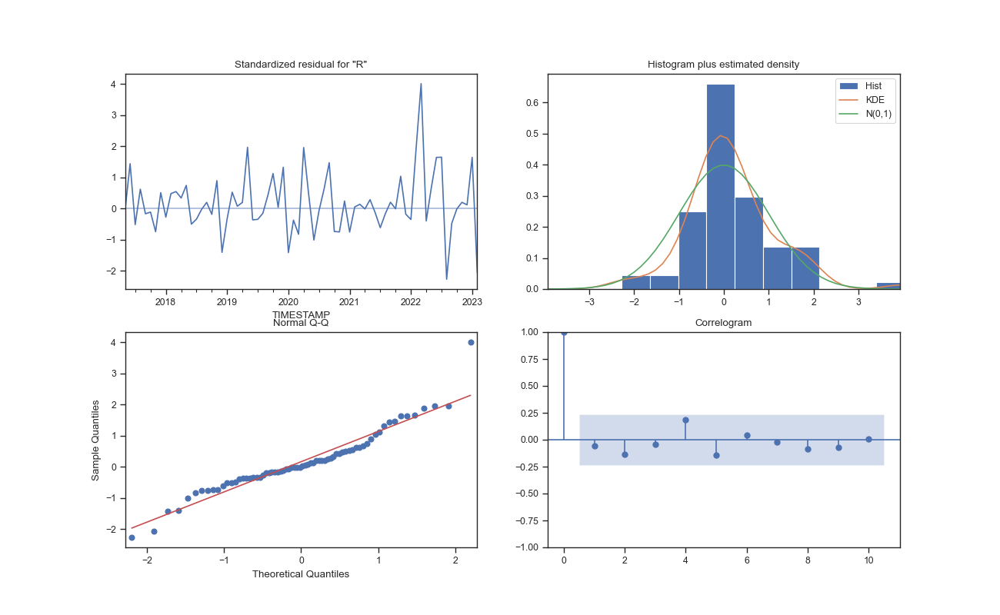

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018F0D8F6F90>


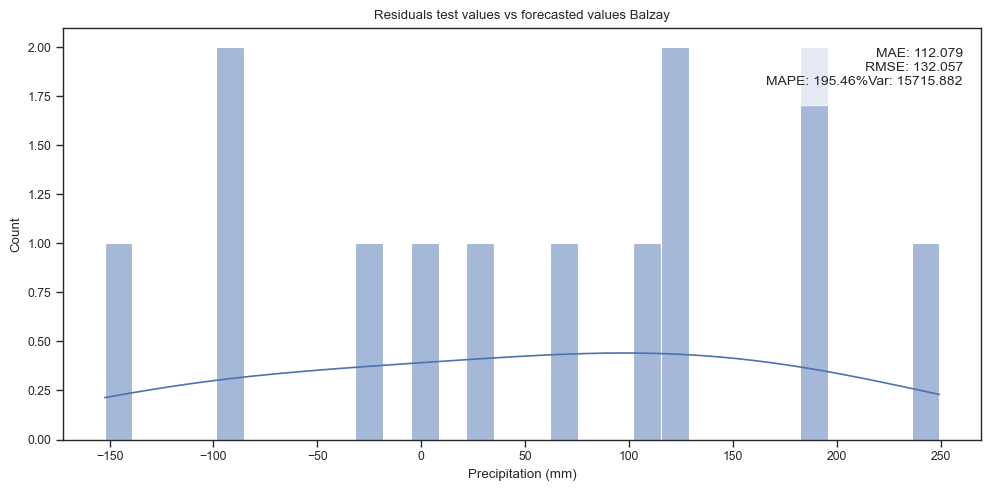

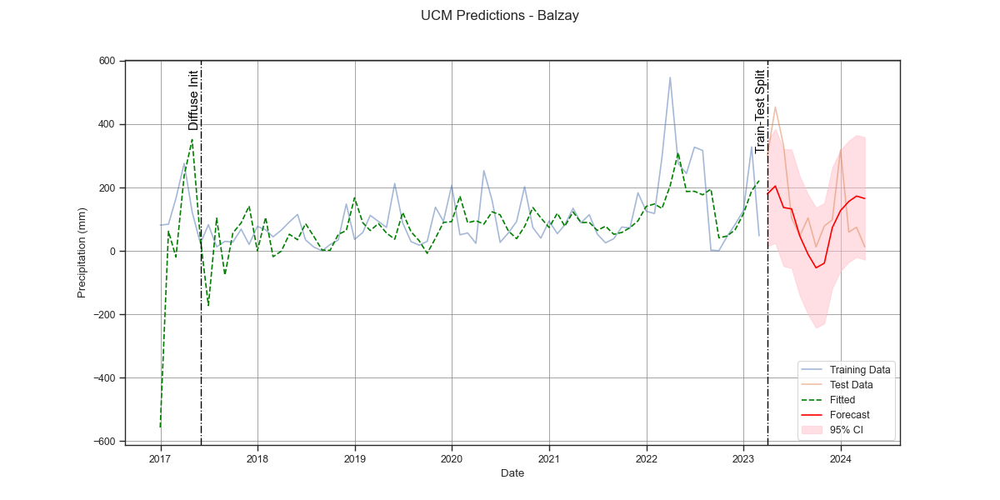


Model Evaluation Metrics:

                   Value
AIC              848.332
BIC              861.823
HQIC             853.691
Log-Likelihood  -418.166
Total Score     2145.679


In [71]:
Balz_train_data = analysis_overview['Precipitation']['Balzay']['train']
Balz_test_data = analysis_overview['Precipitation']['Balzay']['test']

model_P_Balzay = {
    'level': True,
    'stochastic_level':True,
    'trend':False,
    'stochastic_trend':False,
    'cycle':True,
    'stochastic_cycle':False,
    #'seasonal':12,
    'freq_seasonal':[{'period':12,'harmonics':1, 'stochastic':False}],
    'autoregressive':1,
    'exog':exog_vars
}

Balz_P_model = UCM.UnobservedComponentsModel(train_data= Balz_train_data,
                              model_settings= model_P_Balzay,               
                              station='Balzay',
                              unit='Precipitation (mm)',
                              test_data= Balz_test_data)

fit_forecast_model('Precipitation','Balzay', model=Balz_P_model, analysis_overview=analysis_overview, exog_vars_future=exog_vars_future)

### Zhurucay

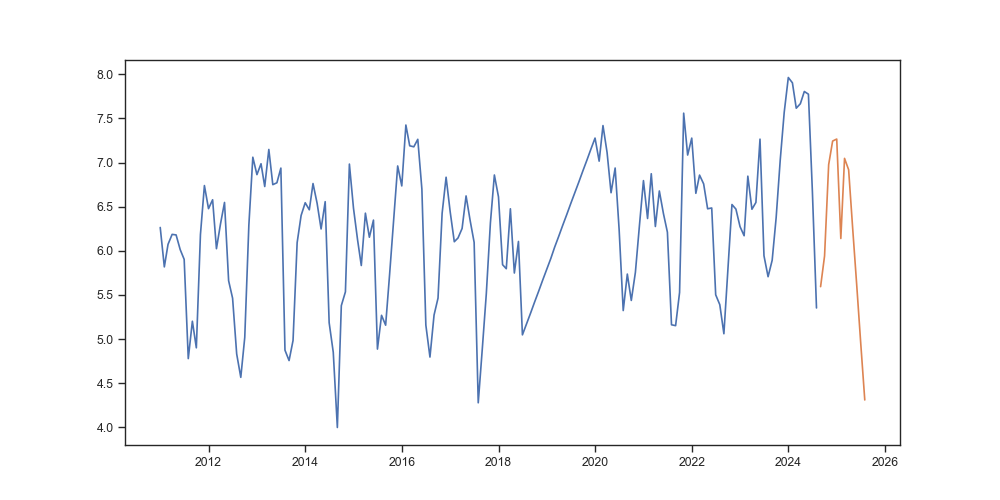

In [72]:
Zhur_T_month = Zhur_T_day.resample('ME').mean()

train_dates = analysis_overview['Precipitation']['Zhurucay']['train_period']
test_dates = analysis_overview['Precipitation']['Zhurucay']['test_period']

Zhur_T_train = Zhur_T_month.loc[train_dates[0]:train_dates[1]].interpolate()
Zhur_T_test = Zhur_T_month.loc[test_dates[0]:test_dates[1]].interpolate()

exog_vars = Zhur_T_train
exog_vars_future = Zhur_T_test

fig,ax = plt.subplots(figsize=(10,5))
ax.plot(exog_vars.index, exog_vars)
ax.plot(exog_vars_future.index, exog_vars_future)
plt.show()

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000018EF8BDCA10>
                            Unobserved Components Results                            
Dep. Variable:                  Valor_mm_day   No. Observations:                  164
Model:                       fixed intercept   Log Likelihood                -704.688
                   + stochastic seasonal(12)   AIC                           1415.375
                                     + AR(1)   BIC                           1424.447
Date:                       Fri, 31 Oct 2025   HQIC                          1419.060
Time:                               16:16:25                                         
Sample:                           12-31-2010                                         
                                - 07-31-2024                                         
Covariance Type:                         opg                                         
                      coef    std err      

c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


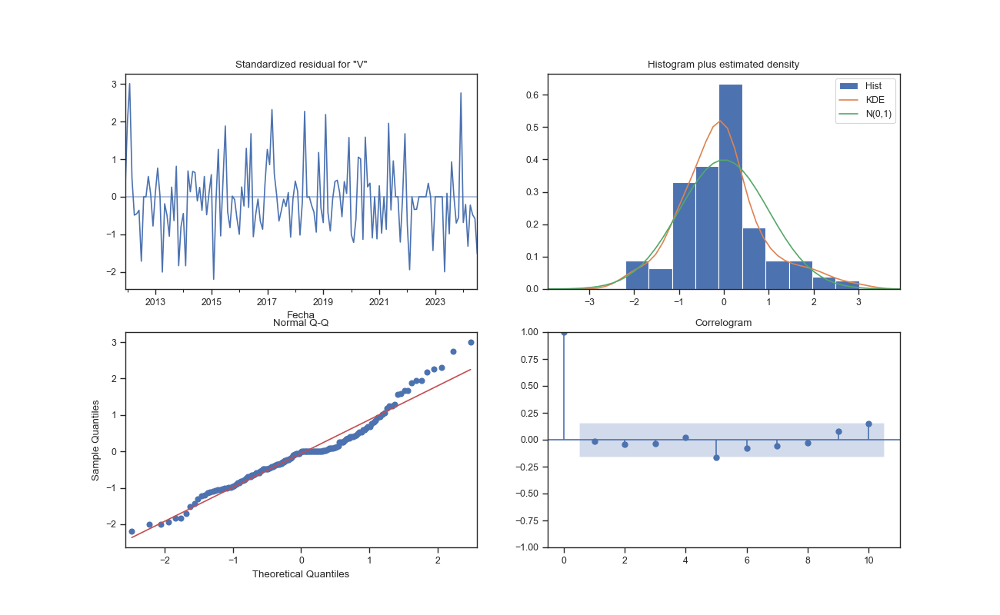

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000018E026E6F90>


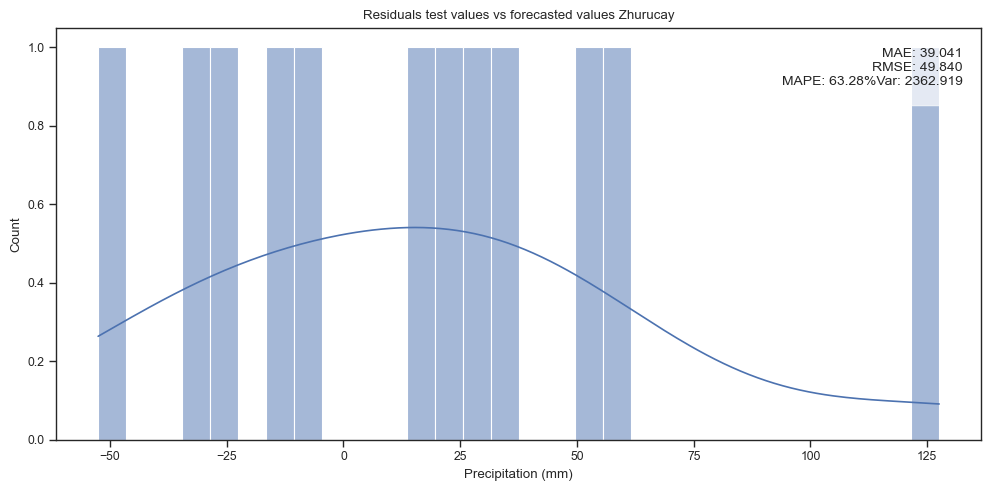

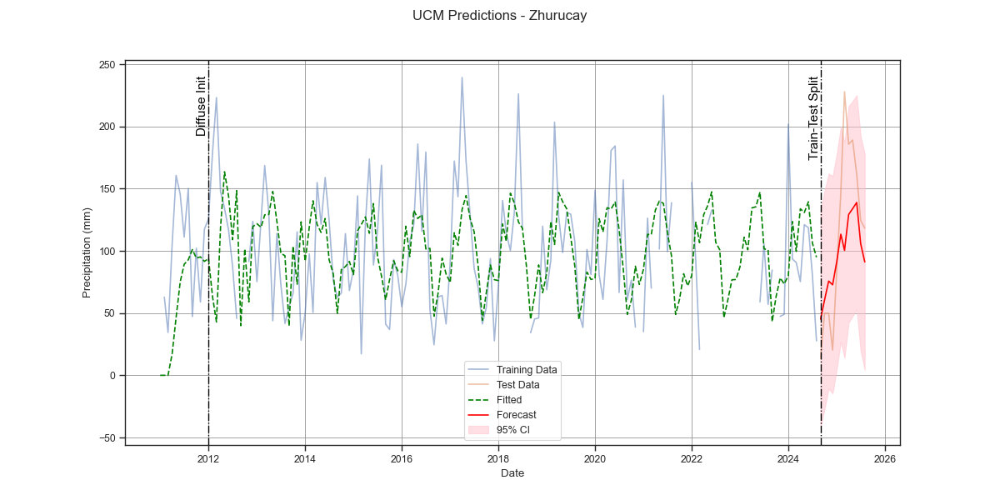


Model Evaluation Metrics:

                   Value
AIC             1415.375
BIC             1424.447
HQIC            1419.060
Log-Likelihood  -704.688
Total Score     3554.195


In [73]:
Zhur_train_data = analysis_overview['Precipitation']['Zhurucay']['train']
Zhur_test_data = analysis_overview['Precipitation']['Zhurucay']['test']

model_P_Zhurucay = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'irregular':False,
    'seasonal':12,
    #'freq_seasonal':[{"period":12,"harmonics":1}],
    'autoregressive':1,
    #'exog':exog_vars
} 

Zhur_P_model = UCM.UnobservedComponentsModel(train_data= Zhur_train_data,
                              model_settings= model_P_Zhurucay,               
                              station='Zhurucay',
                              unit='Precipitation (mm)',
                              test_data= Zhur_test_data)

fit_forecast_model('Precipitation','Zhurucay', model=Zhur_P_model, analysis_overview=analysis_overview)

Model 1 -> not accepted JB
model_P_Zhurucay = {
    'level': True,
    'stochastic_level':False,
    #'trend':True,
    'stochastic_trend':False,
    'irregular':False,
    'seasonal':12,
    #'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':1,
    'exog':exog_vars
}
Value
AIC             1415.598
BIC             1427.694
HQIC            1420.512
Log-Likelihood  -703.799
Total Score     3560.005
RMSE: 49

Model 2 -> not accepted JB
model_P_Zhurucay = {
    'level': True,
    'stochastic_level':False,
    #'trend':True,
    'stochastic_trend':False,
    'irregular':False,
    'seasonal':12,
    #'freq_seasonal':[{"period":12,"harmonics":2}],
    'autoregressive':1
}
Value
AIC             1415.375
BIC             1424.447
HQIC            1419.060
Log-Likelihood  -704.688
Total Score     3554.195
RMSE: 49 
Comment: better score and same RMSE

## Overview of results

In [74]:
from scipy.stats import norm

def plot_residuals(variable):
    data = analysis_overview

    fig, axes = plt.subplots(1, 2, figsize=(13, 6))  # 1 row, 2 columns

    # === Training Residuals KDE ===
    for st, info in data[variable].items():
        residuals = info.get('train_residuals')
        if isinstance(residuals, pd.Series) and not residuals.empty:
            r = residuals.dropna()
            if r.nunique() > 1:
                sb.kdeplot(r, label=st, fill=True, alpha=0.3, ax=axes[0])
            else:
                print(f"⚠️ {st}: residuals constant, skipping KDE.")

    # Add reference normal distribution
    all_train_resid = pd.concat(
        [info.get('train_residuals').dropna() for info in data[variable].values() if isinstance(info.get('train_residuals'), pd.Series)]
    )
    mu, sigma = all_train_resid.mean(), all_train_resid.std()
    x = np.linspace(all_train_resid.min(), all_train_resid.max(), 300)
    axes[0].plot(x, norm.pdf(x, mu, sigma), color='black', lw=2, linestyle='--', label='Normal(μ,σ) reference')

    axes[0].set_title("Training Data Residual Distributions (KDE)")
    axes[0].set_xlabel("Residual Value")
    axes[0].set_ylabel("Density")
    axes[0].legend()
    axes[0].grid(True, linestyle='--', alpha=0.7)

    # === Test Residuals KDE ===
    for st, info in data[variable].items():
        residuals = info.get('test_residuals')
        if isinstance(residuals, pd.Series) and not residuals.empty:
            r = residuals.dropna()
            if r.nunique() > 1:
                sb.kdeplot(r, label=st, fill=True, alpha=0.3, ax=axes[1])
            else:
                print(f"⚠️ {st}: residuals constant, skipping KDE.")

    # Add reference normal distribution for test data
    all_test_resid = pd.concat(
        [info.get('test_residuals').dropna() for info in data[variable].values() if isinstance(info.get('test_residuals'), pd.Series)]
    )
    mu_t, sigma_t = all_test_resid.mean(), all_test_resid.std()
    x_t = np.linspace(all_test_resid.min(), all_test_resid.max(), 300)
    axes[1].plot(x_t, norm.pdf(x_t, mu_t, sigma_t), color='black', lw=2, linestyle='--', label='Normal(μ,σ) reference')

    axes[1].set_title("Test Data Residual Distributions (KDE)")
    axes[1].set_xlabel("Residual Value")
    axes[1].set_ylabel("Density")
    axes[1].legend()
    axes[1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

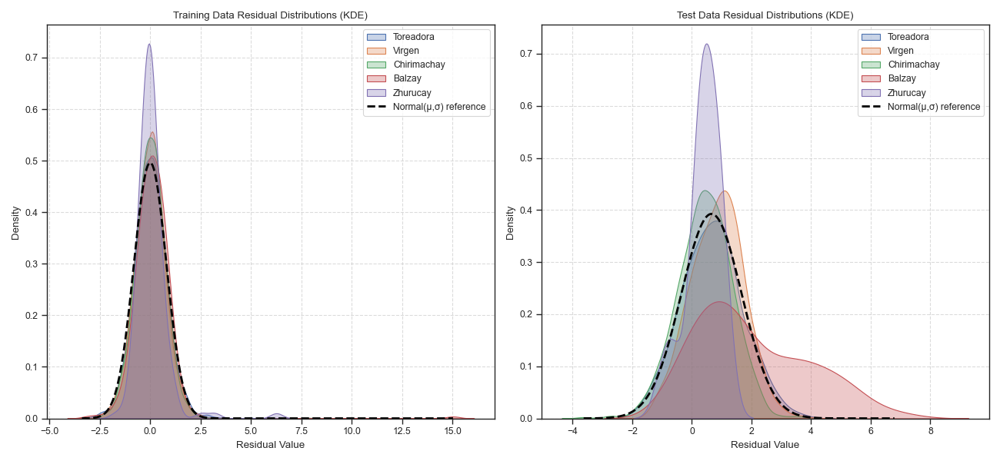

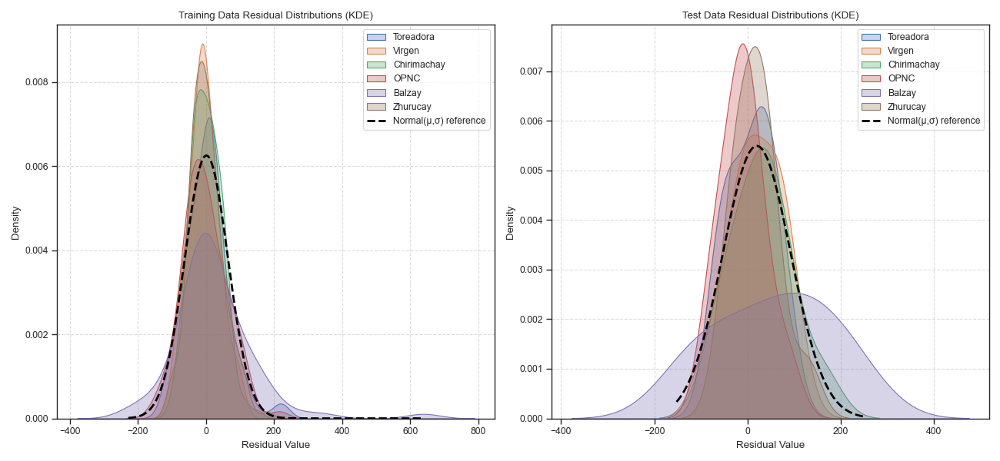

In [75]:
plot_residuals('Temperature')
plot_residuals('Precipitation')

In [76]:
# Collect all results grouped by variable
grouped_data = []

for variable, sites in analysis_overview.items():
    variable_rows = []  # hold per-variable rows
    
    for site, info in sites.items():
        if info['train_residuals'] is not None and len(info['train_residuals']) > 0:
            residuals = info['train_residuals']
            forecast = info['forecast']

            # --- Metrics ---
            rmse = np.sqrt(np.mean(residuals ** 2))
            mape = np.mean(np.abs(residuals / forecast)) * 100
            var_resid = np.var(residuals)

            # --- Model settings ---
            components = info['model_settings']

            # --- Test statistics ---
            perf = info.get('model_performance', {})
            if isinstance(perf, dict):
                JB = perf.get('JB_pval', np.nan)
                Q = perf.get('Q_pval', np.nan)
                H = perf.get('H_pval', np.nan)
            elif isinstance(perf, tuple):
                JB = perf[1].get('JB_pval', np.nan)
                Q = perf[1].get('Q_pval', np.nan)
                H = perf[1].get('H_pval', np.nan)
            else:
                JB = Q = H = np.nan

            # --- Handle seasonality ---
            seasonality = components.get('freq_seasonal', None)
            if seasonality in ([], {}):
                seasonality = None

            # regressors
            regressor = components.get('exog')
            if isinstance(regressor, pd.DataFrame):
                regressor_names = list(regressor.columns)
            elif isinstance(regressor, pd.Series):
                regressor_names = [regressor.name]
            else:
                regressor_names = None  # or [] if no exogenous variables


            variable_rows.append({
                'Variable': variable,
                'Site': site,
                'Level': components.get('level', False),
                'Trend': components.get('trend', False),
                'Stochastic_Trend': components.get('stochastic_trend', False),
                'Seasonality': seasonality,
                'AR_order': components.get('autoregressive', None),
                'regressor':regressor_names,
                'JB_pval': JB,
                'Q_pval': Q,
                'H_pval': H,
                'RMSE': rmse,
                'MAPE': mape,
                'Var_Residuals': var_resid
            })

    # Combine all sites for this variable (preserves order)
    grouped_data.extend(variable_rows)

# Convert everything into one DataFrame
summary_df = pd.DataFrame(grouped_data)

# Optional: set hierarchical index (Variable → Site)
summary_df.set_index(['Variable', 'Site'], inplace=True)

print(summary_df)


                           Level  Trend  Stochastic_Trend  \
Variable      Site                                          
Temperature   Toreadora     True  False             False   
              Virgen        True   True             False   
              Chirimachay   True  False             False   
              Balzay        True  False             False   
              Zhurucay      True   True             False   
Precipitation Toreadora     True   True             False   
              Virgen        True   True             False   
              Chirimachay   True   True             False   
              OPNC          True   True              True   
              Balzay        True  False             False   
              Zhurucay      True  False             False   

                                                                 Seasonality  \
Variable      Site                                                             
Temperature   Toreadora                    [{'

## Trends

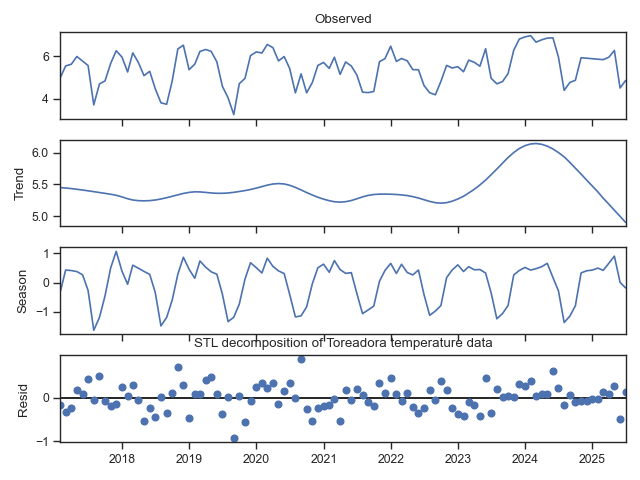

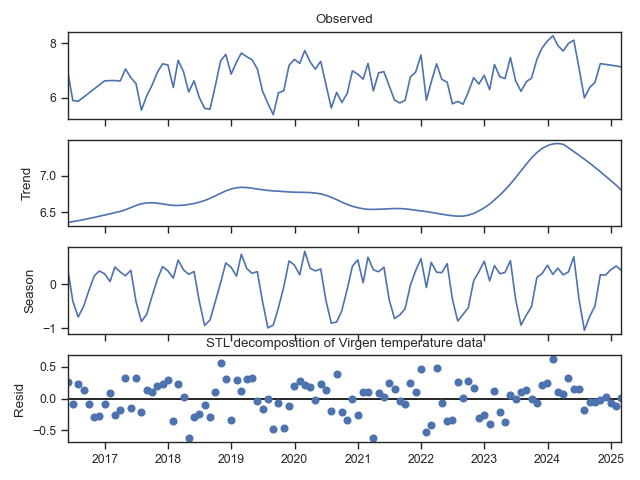

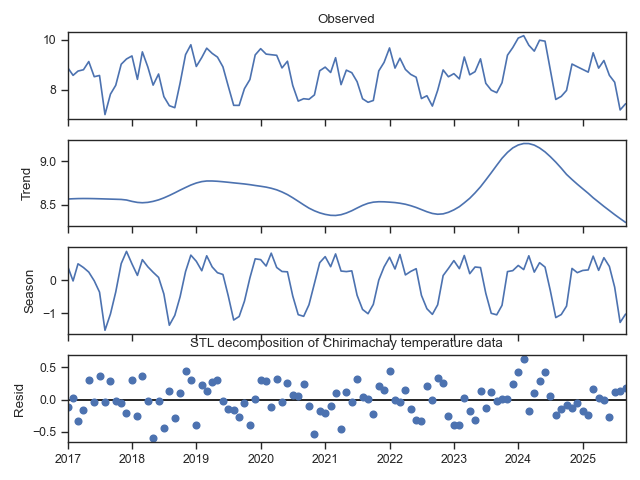

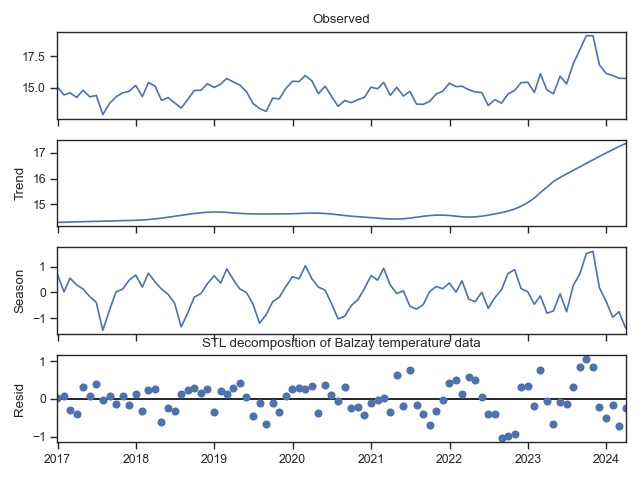

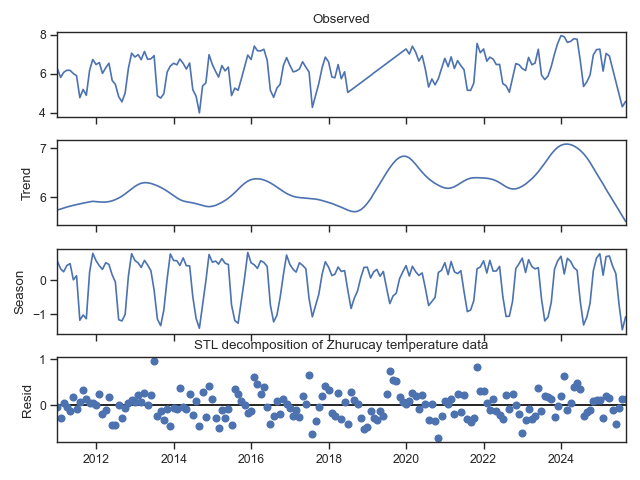

In [77]:
from statsmodels.tsa.seasonal import STL

for station, info in analysis_overview['Temperature'].items():

    if info['raw'] is not None:
        temp = info['raw'].resample('ME').mean()

        # Perform STL decomposition
        temp = temp.interpolate()
        stl = STL(temp, period=12).fit()

        # Plot all components
        stl.plot()
        plt.title(f'STL decomposition of {station} temperature data')
        plt.show()

